In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **MODEL OPTMIZATION**

### Dataset Overview

**Total: 51**

We processes 258-dimensional feature vectors representing pose and hand landmarks. Each sample consists of 30-frame sequences, with integer indices (0-50) mapping to specific gesture names.

The data is split into 70% training, 15% validation, and 15% test sets using stratified sampling to maintain class distribution.


In [ ]:
import numpy as np
X = np.load('/content/X_TRAIN_preprocess.npy')
y = np.load('/content/y_TRAIN_preprocess.npy')

print(X.shape, y.shape)

(3893, 30, 258) (3893,)


In [ ]:
gestures_files = ['abang','anak_lelaki','anak_perempuan','apa','apa_khabar'
,'assalamualaikum','ayah','bagaimana','bahasa_isyarat','baik','baik_2'
,'bapa_saudara','beli','beli_2','berapa','bila','bomba','buat','emak'
,'emak_saudara','hari','hi','hujan','jahat','jangan','kakak','keluarga'
,'kereta','lelaki','lemak','main','mana','masalah','nasi','nasi_lemak'
,'panas','panas_2','pandai','pandai_2','payung','perempuan','perlahan'
,'perlahan_2','pinjam','polis','pukul','ribut','saudara','sejuk','siapa'
,'tandas']

gestures = np.array(gestures_files)
label_map = {label: num for num, label in enumerate(gestures)}
len(gestures)

51

In [ ]:
# Convert the labels into a one-hot encoded format for classification
# For example, if there are 3 classes, label 1 becomes [0, 1, 0], label 2 becomes [0, 0, 1], etc.
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
y = to_categorical(y).astype(int)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

# Training Base Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_recall_fscore_support,
    accuracy_score
)
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [ ]:
# Check if a GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.use_deterministic_algorithms(False)
torch.backends.cudnn.benchmark = True

# Convert data to PyTorch tensors and move to the GPU
X_train = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test = torch.tensor(X_test, dtype=torch.float32).to(device)
y_train = torch.tensor(y_train.argmax(axis=1), dtype=torch.long).to(device)  # Convert to class indices
y_test = torch.tensor(y_test.argmax(axis=1), dtype=torch.long).to(device)  # Convert to class indices

# Define . custom LSTM model and move to the GPU
class CustomLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CustomLSTM, self).__init__()
        self.lstm1 = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.lstm2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
        self.lstm3 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, 64)
        self.fc2 = nn.Linear(64, 128)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, 32)
        self.fc5 = nn.Linear(32, 32)
        self.output_layer = nn.Linear(32, num_classes)

    def forward(self, x):
        x, _ = self.lstm1(x)
        x, _ = self.lstm2(x)
        x, _ = self.lstm3(x)
        x = torch.relu(self.fc1(x[:, -1, :]))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        x = torch.relu(self.fc5(x))
        x = self.output_layer(x)
        return x

# Create empty lists to store loss and accuracy values
train_losses = []
test_losses = []
test_accuracies = []

input_size = 258
hidden_size = 64
num_classes = len(gestures)
model = CustomLSTM(input_size, hidden_size, num_classes).to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())

# Train the model on the GPU
num_epochs = 500
loss_history = []

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    optimizer.zero_grad() # Reset gradients
    outputs = model(X_train) # Forward pass
    loss = criterion(outputs, y_train) # Compute loss
    loss.backward() # Backward pass
    optimizer.step() # Update weights

    epoch_loss += loss.item() # Accumulate loss

    if (epoch + 1) % 10 == 0:
        # Calculate average loss for the epoch
        loss_history.append(epoch_loss)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


# Evaluate the model
model.eval()
with torch.no_grad():
    test_outputs = model(X_test)
    test_loss = criterion(test_outputs, y_test)
    accuracy = (test_outputs.argmax(dim=1) == y_test).float().mean()
    print(f'Test Loss: {test_loss.item():.4f}, Test Accuracy: {accuracy.item():.4f}')

Epoch [10/500], Loss: 3.9276
Epoch [20/500], Loss: 3.9064
Epoch [30/500], Loss: 3.8372
Epoch [40/500], Loss: 3.7159
Epoch [50/500], Loss: 3.4918
Epoch [60/500], Loss: 3.2960
Epoch [70/500], Loss: 3.1177
Epoch [80/500], Loss: 2.9753
Epoch [90/500], Loss: 2.8544
Epoch [100/500], Loss: 2.6981
Epoch [110/500], Loss: 2.8300
Epoch [120/500], Loss: 2.6206
Epoch [130/500], Loss: 2.4864
Epoch [140/500], Loss: 2.3831
Epoch [150/500], Loss: 2.4570
Epoch [160/500], Loss: 2.3199
Epoch [170/500], Loss: 2.1501
Epoch [180/500], Loss: 2.0423
Epoch [190/500], Loss: 2.0686
Epoch [200/500], Loss: 1.9647
Epoch [210/500], Loss: 1.8687
Epoch [220/500], Loss: 2.2462
Epoch [230/500], Loss: 1.9031
Epoch [240/500], Loss: 1.7773
Epoch [250/500], Loss: 1.6972
Epoch [260/500], Loss: 1.6651
Epoch [270/500], Loss: 1.7140
Epoch [280/500], Loss: 1.5833
Epoch [290/500], Loss: 1.4899
Epoch [300/500], Loss: 1.4136
Epoch [310/500], Loss: 1.7050
Epoch [320/500], Loss: 1.4224
Epoch [330/500], Loss: 1.3316
Epoch [340/500], Lo

# Model Evaluation

Evaluates the performance of the trained model. The goal is to assess how well the model generalizes to unseen data and identify potential areas for improvement.

**Evaluation Metrics:**

1. **Accuracy:** Measures the overall correctness of the model's predictions.
2. **Confusion Matrix:** Provides a detailed breakdown of the model's predictions, showing the number of true positives, true negatives, false positives, and false negatives for each gesture class.
3. **Classification Report:** Offers a comprehensive overview of the model's performance, including precision, recall, F1-score, and support for each gesture class.

**Visualization:**

* Confusion Matrix Heatmap: A visual representation of the confusion matrix using a heatmap, aiding in understanding the model's performance across different classes.
* Classification Report Heatmap: A heatmap visualizing the classification report, providing a quick overview of key metrics for each class.


Test Loss: 1.4334, Test Accuracy: 0.5282
Confusion Matrix:
[[3 0 0 ... 0 0 0]
 [0 0 5 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 3 0 0]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 1]]


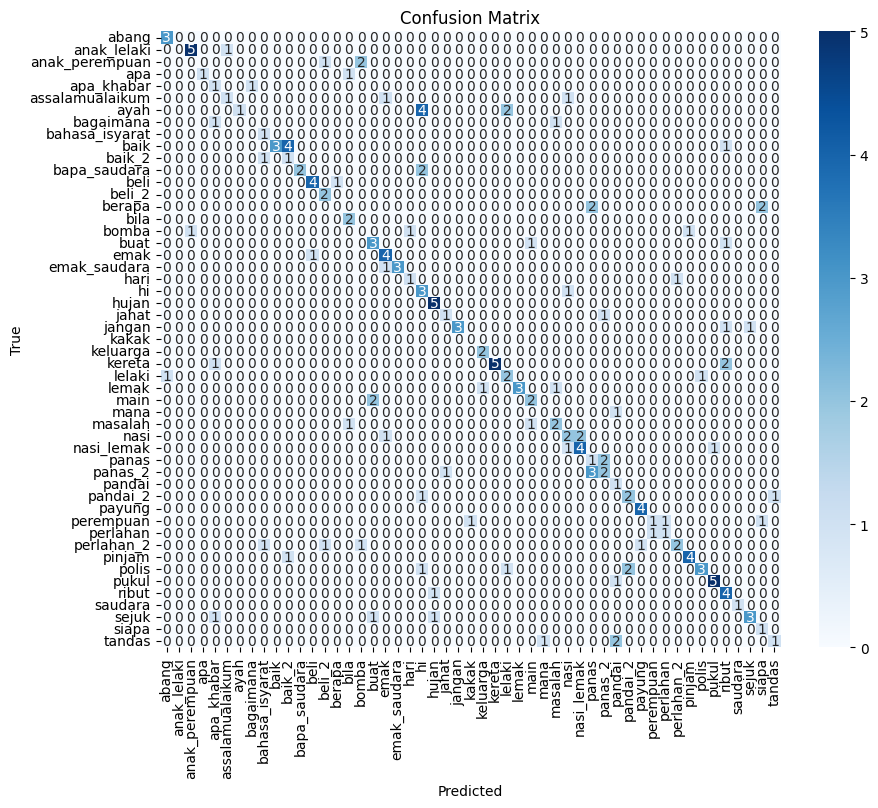

Confusion matrix size: 51x51
Unique classes in test data: 50
Total gesture names: 51
Classification Report:
                 precision    recall  f1-score   support

          abang       0.75      1.00      0.86         3
    anak_lelaki       0.00      0.00      0.00         6
 anak_perempuan       0.00      0.00      0.00         3
            apa       1.00      0.50      0.67         2
     apa_khabar       0.25      0.50      0.33         2
assalamualaikum       0.50      0.33      0.40         3
           ayah       1.00      0.14      0.25         7
      bagaimana       0.00      0.00      0.00         2
 bahasa_isyarat       0.33      1.00      0.50         1
           baik       1.00      0.38      0.55         8
         baik_2       0.17      0.50      0.25         2
   bapa_saudara       1.00      0.50      0.67         4
           beli       0.80      0.80      0.80         5
         beli_2       0.50      1.00      0.67         2
         berapa       0.00      0.00

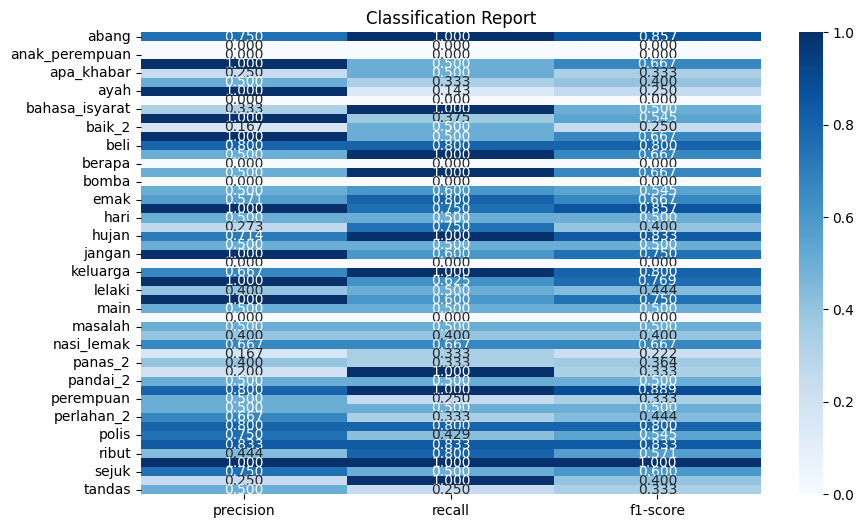

In [ ]:
# Evaluate the model on the GPU
model.eval()
with torch.no_grad():
    test_outputs = model(X_test)
    test_loss = criterion(test_outputs, y_test)
    accuracy = (test_outputs.argmax(dim=1) == y_test).float().mean()
    print(f'Test Loss: {test_loss.item():.4f}, Test Accuracy: {accuracy.item():.4f}')

    # Convert predictions and true labels to numpy arrays
    predicted_labels = test_outputs.argmax(dim=1).cpu().numpy()
    true_labels = y_test.cpu().numpy()

    # Calculate and print the confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(conf_matrix)

    # Get the actual unique classes in the confusion matrix
    # The confusion matrix is square with size = number of unique classes in true_labels
    conf_matrix_classes = list(range(conf_matrix.shape[0]))

    # Map these to gesture names
    present_gestures = [gestures[i] for i in conf_matrix_classes if i < len(gestures)]

    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix,
                annot=True, fmt='d', cmap='Blues',
                xticklabels=present_gestures,
                yticklabels=present_gestures)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    # Print diagnostic info
    print(f"Confusion matrix size: {conf_matrix.shape[0]}x{conf_matrix.shape[1]}")
    print(f"Unique classes in test data: {len(np.unique(true_labels))}")
    print(f"Total gesture names: {len(gestures)}")

    # Get all unique classes that appear in either true or predicted labels
    all_classes_in_data = np.unique(np.concatenate([true_labels, predicted_labels]))

    # Create target names for only classes that appear in the data
    data_gestures = [gestures[i] for i in all_classes_in_data if i < len(gestures)]

    # Generate classification report with only present gestures
    class_report = classification_report(
        true_labels,
        predicted_labels,
        target_names=data_gestures,
        zero_division=0
    )

    print("Classification Report:")
    print(class_report)

    # Create classification report dictionary for plotting
    class_report_dict = classification_report(
        true_labels,
        predicted_labels,
        target_names=data_gestures,
        output_dict=True,
        zero_division=0
    )

    # Plot the classification report
    plt.figure(figsize=(10, 6))
    report_df = pd.DataFrame(class_report_dict).T
    # Exclude the last 3 rows (accuracy averages) for cleaner heatmap
    if len(report_df) > 3:
        plot_data = report_df.iloc[:-3, :-1]
    else:
        plot_data = report_df.iloc[:, :-1]

    sns.heatmap(plot_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title('Classification Report')
    plt.show()

In [ ]:
# Save the trained model
model_filename = 'trained_model.pth'
torch.save(model.state_dict(), model_filename)
print(f"Model saved as {model_filename}")

Model saved as trained_model.pth


# Model Testing

Testing the model with a single video

In [ ]:
# As the Holistic model is an older architecture that is no longer maintained or updated, the Vision model was utilized in this study.
#Therefore, the required Vision task files must be downloaded to enable proper model execution.
!wget -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_lite/float16/1/pose_landmarker_lite.task
!wget -q https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task

In [ ]:
# pip install mediapipe

In [ ]:
import cv2
import torch
import numpy as np
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import warnings
import os
from collections import deque
import time
import random
import torch.nn as nn
from google.colab.patches import cv2_imshow  # Google Colab display


# REPRODUCIBILITY SETTINGS
# ***********************************************************
def set_seed(seed=42):
    """Set all random seeds for reproducibility"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)
    print(f"✓ Random seed set to: {seed}")

set_seed(42)  # Set seed at the beginning

# Suppress warnings
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'


# CONSTANTS
# ***********************************************************
SEQUENCE_LENGTH = 30  # Must match training
CONFIDENCE_THRESHOLD = 0.6  # Minimum confidence for prediction
STABILIZATION_ALPHA = 0.7  # For keypoint smoothing


# MODEL DEFINITION (same as training)
# ***********************************************************

class CustomLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CustomLSTM, self).__init__()
        self.lstm1 = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.lstm2 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
        self.lstm3 = nn.LSTM(hidden_size, hidden_size, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, 64)
        self.fc2 = nn.Linear(64, 128)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, 32)
        self.fc5 = nn.Linear(32, 32)
        self.output_layer = nn.Linear(32, num_classes)

    def forward(self, x):
        x, _ = self.lstm1(x)
        x, _ = self.lstm2(x)
        x, _ = self.lstm3(x)
        x = torch.relu(self.fc1(x[:, -1, :]))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        x = torch.relu(self.fc5(x))
        x = self.output_layer(x)
        return x

# HELPER FUNCTIONS
# ***********************************************************
def stabilize_keypoints(current_keypoints, previous_keypoints, alpha=STABILIZATION_ALPHA):
    """Apply exponential smoothing to stabilize keypoints across frames"""
    if previous_keypoints is None or len(previous_keypoints) != len(current_keypoints):
        return current_keypoints
    return alpha * current_keypoints + (1 - alpha) * previous_keypoints

def reset_sequence_buffer():
    """Reset sequence buffer to ensure consistent starting point"""
    return deque(maxlen=SEQUENCE_LENGTH)

# INITIALIZE MODEL
# ***********************************************************
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Model parameters (MUST match training)
input_size = 258
hidden_size = 64
num_classes = len(gestures)

model = CustomLSTM(input_size, hidden_size, num_classes).to(device)
model.eval()  # Set to evaluation mode

# Load model
model_filename = 'trained_model.pth'
try:
    loaded_model_state_dict = torch.load(model_filename, map_location=device)
    model.load_state_dict(loaded_model_state_dict)
    print(f"✓ Model loaded successfully from {model_filename}")
except Exception as e:
    print(f"✗ Error loading model: {e}")


# MEDIAPIPE INITIALIZATION
# ***********************************************************
BaseOptions = mp.tasks.BaseOptions
PoseLandmarker = mp.tasks.vision.PoseLandmarker
PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
HandLandmarker = mp.tasks.vision.HandLandmarker
HandLandmarkerOptions = mp.tasks.vision.HandLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Check model files
pose_model_path = 'pose_landmarker_lite.task'
hand_model_path = 'hand_landmarker.task'

if not all(os.path.exists(p) for p in [pose_model_path, hand_model_path]):
    print("✗ Model files not found")
    exit()

# Initialize with consistent settings
pose_options = PoseLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=pose_model_path),
    running_mode=VisionRunningMode.VIDEO,
    min_pose_detection_confidence=0.3,
    min_pose_presence_confidence=0.3,
    min_tracking_confidence=0.3
)

hand_options = HandLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=hand_model_path),
    num_hands=2,
    min_hand_detection_confidence=0.3,
    min_tracking_confidence=0.3,
    running_mode=VisionRunningMode.VIDEO
)

pose_landmarker = PoseLandmarker.create_from_options(pose_options)
hand_landmarker = HandLandmarker.create_from_options(hand_options)


# KEYPOINT EXTRACTION (consistent version)
# ***********************************************************
def extract_keypoints_from_task_results(pose_result, hand_result):
    """Extract keypoints - ensure consistent order and format"""
    keypoints = []

    # Pose landmarks - always 132 features in consistent order
    pose_features = [0.0] * (33 * 4)
    if pose_result.pose_landmarks and len(pose_result.pose_landmarks) > 0:
        pose_landmarks = pose_result.pose_landmarks[0]
        for i in range(min(33, len(pose_landmarks))):
            idx = i * 4
            pose_features[idx] = float(pose_landmarks[i].x)
            pose_features[idx + 1] = float(pose_landmarks[i].y)
            pose_features[idx + 2] = float(pose_landmarks[i].z)
            pose_features[idx + 3] = float(pose_landmarks[i].visibility)
    keypoints.extend(pose_features)

    # Hand landmarks - always 126 features (63 left + 63 right) in consistent order
    left_hand = [0.0] * (21 * 3)
    right_hand = [0.0] * (21 * 3)

    if hand_result.hand_landmarks and len(hand_result.hand_landmarks) > 0:
        # Process hands in consistent order
        left_detected = False
        right_detected = False

        for i, hand_landmarks in enumerate(hand_result.hand_landmarks):
            if i >= 2:  # Only process up to 2 hands
                break

            # Extract hand points
            hand_points = []
            for j in range(min(21, len(hand_landmarks))):
                hand_points.extend([
                    float(hand_landmarks[j].x),
                    float(hand_landmarks[j].y),
                    float(hand_landmarks[j].z)
                ])

            # Pad if necessary
            while len(hand_points) < 63:
                hand_points.append(0.0)

            # Assign to left or right based on handedness
            if (i < len(hand_result.handedness) and
                hand_result.handedness[i][0].category_name == 'Left' and
                not left_detected):
                left_hand = hand_points[:63]
                left_detected = True
            elif not right_detected:
                right_hand = hand_points[:63]
                right_detected = True

    keypoints.extend(left_hand)
    keypoints.extend(right_hand)

    # Ensure exactly 258 features
    if len(keypoints) != 258:
        # This should not happen, but pad/truncate if it does
        if len(keypoints) < 258:
            keypoints.extend([0.0] * (258 - len(keypoints)))
        else:
            keypoints = keypoints[:258]

    return np.array(keypoints, dtype=np.float32)


# VIDEO PROCESSING WITH CONSISTENT PREDICTIONS
# ***********************************************************
# Find video file
video_path = 'v2.mp4'
found_path = None
for path in [video_path, 'test_videos/' + video_path, 'videos/' + video_path]:
    if os.path.exists(path):
        found_path = path
        break

if not found_path:
    # Search for any video file
    for file in os.listdir('.'):
        if file.lower().endswith(('.mp4', '.avi', '.mov', '.mkv')):
            found_path = file
            break

if not found_path:
    print("✗ No video files found.")
    exit()

# Open video
cap = cv2.VideoCapture(found_path)
if not cap.isOpened():
    print(f"✗ Could not open video: {found_path}")
    exit()

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS) or 30
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_interval = int(1000 / fps)

print(f"\nProcessing: {found_path}")
print(f"Total frames: {total_frames}, FPS: {fps}")

# Initialize with consistent state
sequence = reset_sequence_buffer()
predictions = []
confident_predictions = []
previous_keypoints = None
frame_count = 0
timestamp_ms = 0

# Statistics
prediction_history = []

print("\nStarting consistent gesture recognition...")

try:
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1

        # Process frame
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_frame)

        # Get landmarks
        pose_result = pose_landmarker.detect_for_video(mp_image, timestamp_ms)
        hand_result = hand_landmarker.detect_for_video(mp_image, timestamp_ms)

        # Extract and stabilize keypoints
        keypoints = extract_keypoints_from_task_results(pose_result, hand_result)
        if previous_keypoints is not None:
            keypoints = stabilize_keypoints(keypoints, previous_keypoints)
        previous_keypoints = keypoints

        # Add to sequence
        sequence.append(keypoints)

        # Make prediction when buffer is full
        if len(sequence) == SEQUENCE_LENGTH:
            # Prepare input tensor
            sequence_array = np.array(list(sequence), dtype=np.float32)
            sequence_array = np.expand_dims(sequence_array, axis=0)

            # Convert to tensor with consistent precision
            input_tensor = torch.tensor(sequence_array, dtype=torch.float32).to(device)

            # Predict with deterministic operations
            with torch.no_grad():
                res = model(input_tensor)
                probabilities = torch.softmax(res, dim=1)
                max_val, max_idx = torch.max(probabilities, dim=1)

                confidence = max_val.item()
                prediction_idx = max_idx.item()

                # Store all predictions for analysis
                predictions.append(prediction_idx)

                # Only accept predictions above confidence threshold
                if confidence > CONFIDENCE_THRESHOLD:
                    confident_predictions.append(prediction_idx)
                    current_prediction = prediction_idx
                else:
                    current_prediction = -1  # No confident prediction

                # Store for history
                prediction_history.append({
                    'frame': frame_count,
                    'prediction': prediction_idx,
                    'confidence': confidence,
                    'accepted': confidence > CONFIDENCE_THRESHOLD,
                    'all_probs': probabilities[0].cpu().numpy()
                })

                # Print debug info
                if frame_count % 30 == 0:
                    print(f"\nFrame {frame_count}:")
                    print(f"  Raw prediction: {gestures[prediction_idx]} ({confidence:.2%})")
                    print(f"  Accepted: {confidence > CONFIDENCE_THRESHOLD}")
                    print(f"  Buffer: {len(sequence)}/{SEQUENCE_LENGTH}")

        # Update timestamp
        timestamp_ms += frame_interval

        # Simple display (optional)
        if frame_count % 5 == 0:
            display_frame = frame.copy()
            cv2.putText(display_frame, f"Frame: {frame_count}/{total_frames}", (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
            cv2.putText(display_frame, f"Buffer: {len(sequence)}/{SEQUENCE_LENGTH}", (10, 60),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)

            if len(predictions) > 0:
                last_pred = predictions[-1]
                last_conf = prediction_history[-1]['confidence'] if prediction_history else 0
                color = (0, 255, 0) if last_conf > CONFIDENCE_THRESHOLD else (0, 0, 255)
                cv2.putText(display_frame, f"Pred: {gestures[last_pred]} ({last_conf:.1%})",
                           (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

            # Use cv2_imshow for Google Colab
            cv2_imshow(display_frame)

            # Check for 'q' key press (non-blocking for Colab)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

except Exception as e:
    print(f"Error: {e}")
    import traceback
    traceback.print_exc()

finally:
    cap.release()
    cv2.destroyAllWindows()
    pose_landmarker.close()
    hand_landmarker.close()

    # ANALYSIS - Check consistency
    print(f"\n{'='*60}")
    print("CONSISTENCY ANALYSIS")
    print(f"{'='*60}")

    if prediction_history:
        # Check if predictions are consistent
        all_predictions = [p['prediction'] for p in prediction_history]
        confident_only = [p['prediction'] for p in prediction_history if p['accepted']]

        print(f"\nTotal predictions made: {len(all_predictions)}")
        print(f"Confident predictions (> {CONFIDENCE_THRESHOLD:.0%}): {len(confident_only)}")

        # Count prediction changes
        changes = 0
        for i in range(1, len(all_predictions)):
            if all_predictions[i] != all_predictions[i-1]:
                changes += 1

        print(f"\nPrediction changes (raw): {changes}")
        print(f"Change rate: {changes/len(all_predictions)*100:.1f}%")

        # Show most common predictions
        from collections import Counter
        pred_counter = Counter(confident_only if confident_only else all_predictions)

        print(f"\nMost common predictions:")
        for pred_idx, count in pred_counter.most_common():
            percentage = count / len(confident_only if confident_only else all_predictions) * 100
            print(f"  {gestures[pred_idx]}: {count} times ({percentage:.1f}%)")

        # Save prediction history for comparison
        import pickle
        with open(f'prediction_history_{int(time.time())}.pkl', 'wb') as f:
            pickle.dump(prediction_history, f)
        print(f"\n✓ Prediction history saved for comparison")

print("\n✅ Processing complete!")

In [ ]:
# Enhanced model 1:  SIGN LANGUAGE MODEL (BiLSTM + ATTENTION)

In [ ]:

# ENHANCED SIGN LANGUAGE MODEL (BiLSTM + ATTENTION)
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim

# DEVICE
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# DATA → GPU
X_train = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test  = torch.tensor(X_test,  dtype=torch.float32).to(device)

y_train = torch.tensor(y_train.argmax(axis=1), dtype=torch.long).to(device)
y_test  = torch.tensor(y_test.argmax(axis=1),  dtype=torch.long).to(device)

# TEMPORAL ATTENTION MODULE
class TemporalAttention(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.attn = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        # x: (B, T, H)
        weights = torch.softmax(self.attn(x), dim=1)   # (B, T, 1)
        return torch.sum(weights * x, dim=1)            # (B, H)

# ENHANCED MODEL

class EnhancedBiLSTMAttention(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super().__init__()

        # BiLSTM Stack
        self.lstm1 = nn.LSTM(
            input_size, hidden_size,
            batch_first=True, bidirectional=True
        )
        self.norm1 = nn.LayerNorm(hidden_size * 2)

        self.lstm2 = nn.LSTM(
            hidden_size * 2, hidden_size,
            batch_first=True, bidirectional=True
        )
        self.norm2 = nn.LayerNorm(hidden_size * 2)

        # Attention
        self.attention = TemporalAttention(hidden_size * 2)

        # Classifier
        self.fc1 = nn.Linear(hidden_size * 2, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, num_classes)

        self.dropout = nn.Dropout(0.4)
        self.relu = nn.ReLU()

    def forward(self, x):
        # x: (B, 30, 258)

        x, _ = self.lstm1(x)
        x = self.norm1(x)

        x, _ = self.lstm2(x)
        x = self.norm2(x)

        # Attention over time
        x = self.attention(x)

        # Classification head
        x = self.dropout(self.relu(self.fc1(x)))
        x = self.dropout(self.relu(self.fc2(x)))
        x = self.fc3(x)

        return x

# MODEL SETUP

input_size = 258
hidden_size = 128      # increased capacity
num_classes = len(gestures)

model = EnhancedBiLSTMAttention(
    input_size, hidden_size, num_classes
).to(device)

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)

# TRAIING LOOP

num_epochs = 300
best_acc = 0.0

for epoch in range(num_epochs):
    model.train()

    optimizer.zero_grad()
    outputs = model(X_train)
    loss = criterion(outputs, y_train)
    loss.backward()

    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()

    # -------------------------
    # VALIDATION
    # -------------------------
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test)
        val_acc = (val_outputs.argmax(1) == y_test).float().mean()

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), "best_enhanced_bilstm_attention.pth")

    if (epoch + 1) % 5 == 0:
        print(
            f"Epoch [{epoch+1:03d}] | "
            f"Loss: {loss.item():.4f} | "
            f"Val Acc: {val_acc.item():.4f}"
        )

print(f"\nBest Validation Accuracy: {best_acc:.4f}")


Using device: cuda
Epoch [005] | Loss: 3.8340 | Val Acc: 0.0718
Epoch [010] | Loss: 3.6200 | Val Acc: 0.1282
Epoch [015] | Loss: 3.4152 | Val Acc: 0.1538
Epoch [020] | Loss: 3.2042 | Val Acc: 0.1949
Epoch [025] | Loss: 3.0267 | Val Acc: 0.2256
Epoch [030] | Loss: 2.8818 | Val Acc: 0.3077
Epoch [035] | Loss: 2.7508 | Val Acc: 0.3590
Epoch [040] | Loss: 2.6515 | Val Acc: 0.4051
Epoch [045] | Loss: 2.6018 | Val Acc: 0.4000
Epoch [050] | Loss: 2.4489 | Val Acc: 0.4359
Epoch [055] | Loss: 2.3529 | Val Acc: 0.4718
Epoch [060] | Loss: 2.2861 | Val Acc: 0.5128
Epoch [065] | Loss: 2.1796 | Val Acc: 0.5026
Epoch [070] | Loss: 2.1556 | Val Acc: 0.5179
Epoch [075] | Loss: 2.0646 | Val Acc: 0.5744
Epoch [080] | Loss: 1.9644 | Val Acc: 0.6154
Epoch [085] | Loss: 1.9045 | Val Acc: 0.5846
Epoch [090] | Loss: 1.8535 | Val Acc: 0.6359
Epoch [095] | Loss: 1.7806 | Val Acc: 0.6359
Epoch [100] | Loss: 1.7746 | Val Acc: 0.6769
Epoch [105] | Loss: 1.7781 | Val Acc: 0.6872
Epoch [110] | Loss: 1.6888 | Val Acc

Test Loss: 1.0048, Test Accuracy: 0.9282
Confusion Matrix:
[[4 0 0 ... 0 0 0]
 [0 2 2 ... 0 0 0]
 [0 0 4 ... 0 0 0]
 ...
 [0 0 0 ... 8 0 0]
 [0 0 0 ... 0 2 0]
 [0 0 0 ... 0 0 3]]


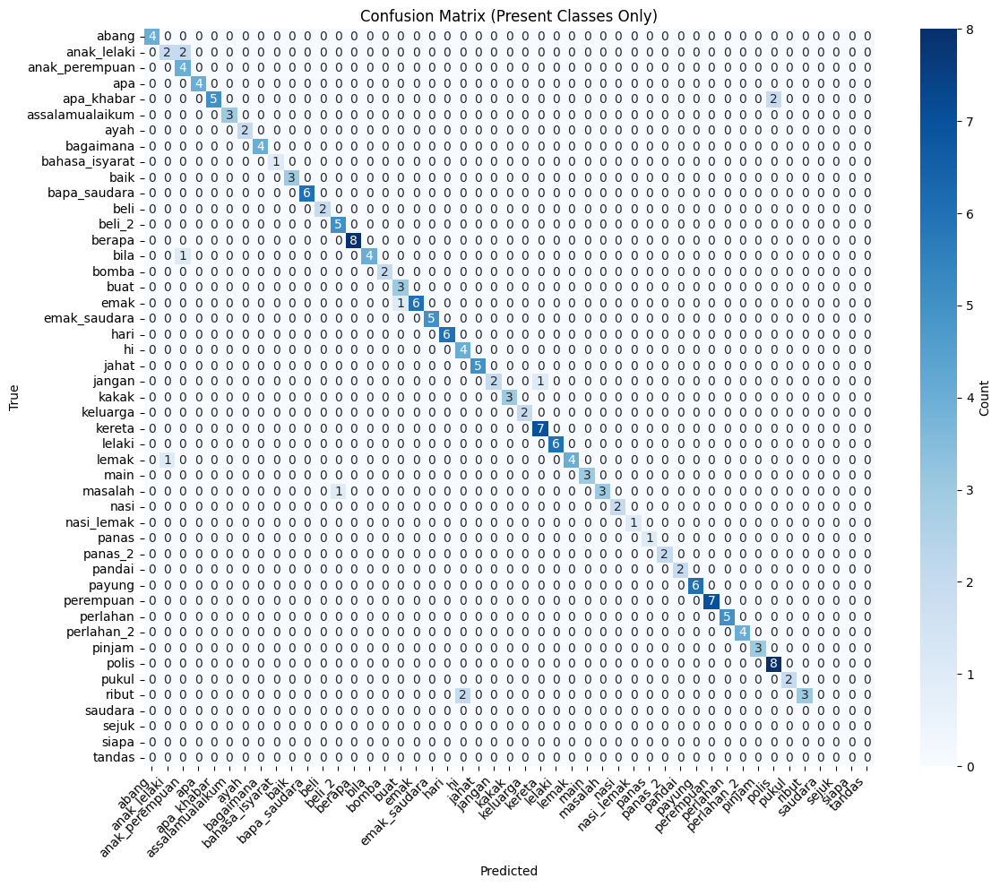


Confusion matrix size: 47x47
Unique classes in true labels: 47
Unique classes in predictions: 47
Unique classes present: 47
Total gesture names: 51
Present gesture names: 47

Missing classes in test data (4):
  Class 10: baik_2
  Class 22: hujan
  Class 31: mana
  Class 38: pandai_2

CLASSIFICATION REPORT
                 precision    recall  f1-score   support

          abang     1.0000    1.0000    1.0000         4
    anak_lelaki     0.6667    0.5000    0.5714         4
 anak_perempuan     0.5714    1.0000    0.7273         4
            apa     1.0000    1.0000    1.0000         4
     apa_khabar     1.0000    0.7143    0.8333         7
assalamualaikum     1.0000    1.0000    1.0000         3
           ayah     0.6667    1.0000    0.8000         2
      bagaimana     1.0000    1.0000    1.0000         4
 bahasa_isyarat     1.0000    1.0000    1.0000         1
           baik     1.0000    1.0000    1.0000         3
   bapa_saudara     1.0000    0.8333    0.9091         6
       

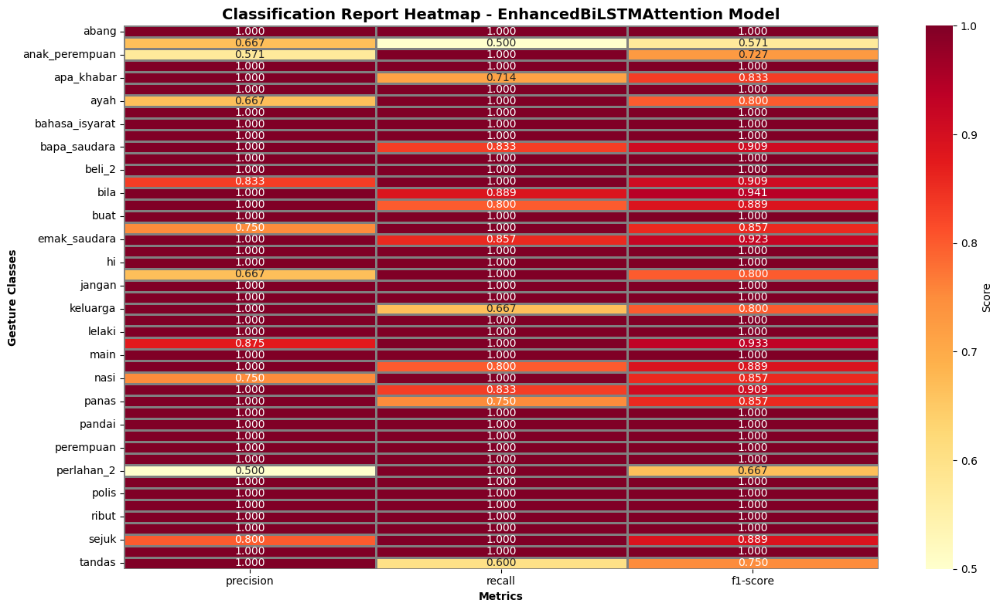


DETAILED PERFORMANCE ANALYSIS

Gesture Performance Ranking (Sorted by F1-Score):
 Gesture_ID    Gesture_Name  Accuracy  Precision  Recall  F1_Score  Support
          0           abang    1.0000     1.0000  1.0000    1.0000   4.0000
          5 assalamualaikum    1.0000     1.0000  1.0000    1.0000   3.0000
          3             apa    1.0000     1.0000  1.0000    1.0000   4.0000
         12            beli    1.0000     1.0000  1.0000    1.0000   6.0000
          9            baik    1.0000     1.0000  1.0000    1.0000   3.0000
          8  bahasa_isyarat    1.0000     1.0000  1.0000    1.0000   1.0000
          7       bagaimana    1.0000     1.0000  1.0000    1.0000   4.0000
         13          beli_2    1.0000     1.0000  1.0000    1.0000   2.0000
         27          kereta    1.0000     1.0000  1.0000    1.0000   3.0000
         28          lelaki    1.0000     1.0000  1.0000    1.0000   2.0000
         30            main    1.0000     1.0000  1.0000    1.0000   6.0000
      

In [ ]:
# Evaluate the model on the GPU
model.eval()
with torch.no_grad():
    test_outputs = model(X_test)
    test_loss = criterion(test_outputs, y_test)
    accuracy = (test_outputs.argmax(dim=1) == y_test).float().mean()
    print(f'Test Loss: {test_loss.item():.4f}, Test Accuracy: {accuracy.item():.4f}')

    # Convert predictions and true labels to numpy arrays
    predicted_labels = test_outputs.argmax(dim=1).cpu().numpy()
    true_labels = y_test.cpu().numpy()

    # Calculate and print the confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(conf_matrix)

    # Get unique classes present in true and predicted labels
    unique_true = np.unique(true_labels)
    unique_pred = np.unique(predicted_labels)
    unique_classes = np.unique(np.concatenate([unique_true, unique_pred]))

    # Create a mapping from class index to gesture name for present classes
    present_gesture_names = []
    present_indices = []

    for idx in unique_classes:
        if idx < len(gestures):
            present_gesture_names.append(gestures[idx])
            present_indices.append(idx)

    # Plot the confusion matrix (only for present classes)
    plt.figure(figsize=(12, 10))

    if len(present_indices) > 0:
        # Create subset confusion matrix for only present classes
        subset_matrix = np.zeros((len(present_indices), len(present_indices)), dtype=int)

        # Map original indices to subset indices
        idx_to_subset = {orig: new for new, orig in enumerate(present_indices)}

        # Fill the subset matrix
        for i, true_idx in enumerate(present_indices):
            for j, pred_idx in enumerate(present_indices):
                if true_idx < conf_matrix.shape[0] and pred_idx < conf_matrix.shape[1]:
                    subset_matrix[i, j] = conf_matrix[true_idx, pred_idx]

        # Plot subset confusion matrix
        sns.heatmap(subset_matrix,
                    annot=True, fmt='d', cmap='Blues',
                    xticklabels=present_gesture_names,
                    yticklabels=present_gesture_names,
                    cbar_kws={'label': 'Count'})

        plt.title('Confusion Matrix (Present Classes Only)')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
    else:
        print("No classes present in predictions")
        subset_matrix = np.array([])

    # Print diagnostic info
    print(f"\nConfusion matrix size: {conf_matrix.shape[0]}x{conf_matrix.shape[1]}")
    print(f"Unique classes in true labels: {len(unique_true)}")
    print(f"Unique classes in predictions: {len(unique_pred)}")
    print(f"Unique classes present: {len(unique_classes)}")
    print(f"Total gesture names: {len(gestures)}")
    print(f"Present gesture names: {len(present_gesture_names)}")

    # Identify missing classes
    all_classes = set(range(len(gestures)))
    present_classes_set = set(unique_classes)
    missing_classes = sorted(all_classes - present_classes_set)

    if missing_classes:
        print(f"\nMissing classes in test data ({len(missing_classes)}):")
        for class_idx in missing_classes:
            if class_idx < len(gestures):
                print(f"  Class {class_idx}: {gestures[class_idx]}")

    # Generate classification report with only present gestures
    print(f"\n{'='*80}")
    print("CLASSIFICATION REPORT")
    print(f"{'='*80}")

    # Create classification report dictionary
    class_report_dict = classification_report(
        true_labels,
        predicted_labels,
        labels=present_indices if len(present_indices) > 0 else None,
        target_names=present_gesture_names if len(present_gesture_names) > 0 else None,
        output_dict=True,
        zero_division=0
    )

    # Print the classification report
    class_report_str = classification_report(
        true_labels,
        predicted_labels,
        labels=present_indices if len(present_indices) > 0 else None,
        target_names=present_gesture_names if len(present_gesture_names) > 0 else None,
        digits=4,
        zero_division=0
    )
    print(class_report_str)

    # Plot the classification report heatmap
    if len(present_gesture_names) > 0:
        plt.figure(figsize=(14, 8))

        # Convert to DataFrame
        report_df = pd.DataFrame(class_report_dict).T

        # Separate class metrics and aggregate metrics
        if 'accuracy' in report_df.columns:
            # Handle sklearn version differences
            class_metrics = report_df.iloc[:-3] if len(report_df) > 3 else report_df
        elif len(report_df) > 3:
            class_metrics = report_df.iloc[:-3]
        else:
            class_metrics = report_df

        # Prepare data for heatmap
        heatmap_columns = ['precision', 'recall', 'f1-score']
        available_columns = [col for col in heatmap_columns if col in class_metrics.columns]

        if available_columns:
            heatmap_data = class_metrics[available_columns]

            # Create heatmap
            sns.heatmap(heatmap_data, annot=True, cmap='YlOrRd',
                        fmt='.3f', linewidths=1, linecolor='gray',
                        cbar_kws={'label': 'Score'})

            plt.title('Classification Report Heatmap - EnhancedBiLSTMAttention Model',
                      fontsize=14, fontweight='bold')
            plt.xlabel('Metrics', fontweight='bold')
            plt.ylabel('Gesture Classes', fontweight='bold')
            plt.xticks(rotation=0)
            plt.yticks(rotation=0)
            plt.tight_layout()
            plt.show()

    # Additional detailed analysis
    print(f"\n{'='*80}")
    print("DETAILED PERFORMANCE ANALYSIS")
    print(f"{'='*80}")

    # Calculate per-class accuracy from confusion matrix
    # Handle case where some classes might have zero samples
    class_accuracy = []
    for i in range(conf_matrix.shape[0]):
        if conf_matrix[i].sum() > 0:
            class_accuracy.append(conf_matrix[i, i] / conf_matrix[i].sum())
        else:
            class_accuracy.append(0.0)

    # Create comprehensive performance summary
    performance_data = []
    for i, class_idx in enumerate(present_indices):
        if class_idx < len(gestures):
            gesture_name = gestures[class_idx]

            # Get metrics from classification report
            if gesture_name in class_report_dict:
                metrics = class_report_dict[gesture_name]
                precision = metrics.get('precision', 0)
                recall = metrics.get('recall', 0)
                f1 = metrics.get('f1-score', 0)
                support = metrics.get('support', 0)
            else:
                # Estimate from confusion matrix
                if class_idx < conf_matrix.shape[0]:
                    row_sum = conf_matrix[class_idx].sum()
                    col_sum = conf_matrix[:, class_idx].sum()
                    support = row_sum
                    precision = conf_matrix[class_idx, class_idx] / col_sum if col_sum > 0 else 0
                    recall = conf_matrix[class_idx, class_idx] / row_sum if row_sum > 0 else 0
                    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
                else:
                    precision = recall = f1 = 0
                    support = 0

            # Get accuracy for this class
            accuracy_val = class_accuracy[class_idx] if class_idx < len(class_accuracy) else 0

            performance_data.append({
                'Gesture_ID': class_idx,
                'Gesture_Name': gesture_name,
                'Accuracy': accuracy_val,
                'Precision': precision,
                'Recall': recall,
                'F1_Score': f1,
                'Support': support
            })

    if performance_data:
        # Create DataFrame and sort by F1-Score
        performance_df = pd.DataFrame(performance_data)
        performance_df = performance_df.sort_values('F1_Score', ascending=False)

        print(f"\nGesture Performance Ranking (Sorted by F1-Score):")
        print(performance_df.to_string(index=False, float_format=lambda x: f'{x:.4f}' if isinstance(x, (float, np.floating)) else str(x)))

        # Summary statistics
        print(f"\n OVERALL PERFORMANCE SUMMARY:")
        print(f"  Test Accuracy: {accuracy.item():.4%}")
        print(f"  Test Loss: {test_loss.item():.4f}")
        print(f"  Number of test samples: {len(true_labels)}")
        print(f"  Classes present in test: {len(present_indices)}/{len(gestures)}")

        if 'macro avg' in class_report_dict:
            print(f"  Macro-average F1: {class_report_dict['macro avg']['f1-score']:.4f}")
        if 'weighted avg' in class_report_dict:
            print(f"  Weighted-average F1: {class_report_dict['weighted avg']['f1-score']:.4f}")

        # Performance distribution
        f1_scores = performance_df['F1_Score'].values
        print(f"\n PERFORMANCE DISTRIBUTION:")
        print(f"  Best F1-Score: {f1_scores.max():.4f}")
        print(f"  Worst F1-Score: {f1_scores.min():.4f}")
        print(f"  Average F1-Score: {f1_scores.mean():.4f}")
        print(f"  Standard Deviation: {f1_scores.std():.4f}")

        # Count performance categories
        excellent = sum(f1_scores >= 0.9)
        good = sum((f1_scores >= 0.7) & (f1_scores < 0.9))
        fair = sum((f1_scores >= 0.5) & (f1_scores < 0.7))
        poor = sum(f1_scores < 0.5)

        print(f"\n PERFORMANCE CATEGORIES:")
        print(f"  Excellent (F1 ≥ 0.9): {excellent} gestures")
        print(f"  Good (0.7 ≤ F1 < 0.9): {good} gestures")
        print(f"  Fair (0.5 ≤ F1 < 0.7): {fair} gestures")
        print(f"  Poor (F1 < 0.5): {poor} gestures")

        # Additional insights
        print(f"\n ADDITIONAL INSIGHTS:")

        # Most confused gesture pairs
        if len(subset_matrix) > 0 and np.sum(subset_matrix) > 0:
            confusion_pairs = []
            for i in range(subset_matrix.shape[0]):
                for j in range(subset_matrix.shape[1]):
                    if i != j and subset_matrix[i, j] > 0:
                        true_name = present_gesture_names[i]
                        pred_name = present_gesture_names[j]
                        count = subset_matrix[i, j]
                        confusion_pairs.append((true_name, pred_name, count))

            if confusion_pairs:
                confusion_pairs.sort(key=lambda x: x[2], reverse=True)
                print(f"\n Top 5 most confused gesture pairs:")
                for true_name, pred_name, count in confusion_pairs[:5]:
                    print(f"  '{true_name}' predicted as '{pred_name}': {count} times")

        # Classes with zero predictions
        zero_prediction_classes = []
        for i, class_idx in enumerate(present_indices):
            if class_idx < conf_matrix.shape[0]:
                # Check if any predictions for this class
                if conf_matrix[:, class_idx].sum() == 0:
                    zero_prediction_classes.append(gestures[class_idx])

        if zero_prediction_classes:
            print(f"\n Classes with zero predictions: {zero_prediction_classes}")

        # Classes with zero true samples but predicted
        zero_true_classes = []
        for i, class_idx in enumerate(present_indices):
            if class_idx < conf_matrix.shape[0]:
                # Check if any true samples for this class
                if conf_matrix[class_idx, :].sum() == 0:
                    zero_true_classes.append(gestures[class_idx])

        if zero_true_classes:
            print(f"\n Classes with zero true samples but predicted: {zero_true_classes}")
    else:
        print("No performance data available - no classes present in test set")

In [ ]:
# Save the trained model
model_filename = 'trained_model_bilstm.pth'
torch.save(model.state_dict(), model_filename)
print(f"Model saved as {model_filename}")

Model saved as trained_model_bilstm.pth


## Test model Bilstm

In [ ]:
# For Google Colab, use cv2_imshow instead of cv2.imshow
import cv2
from google.colab.patches import cv2_imshow  # Add this import
import torch
import numpy as np
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import warnings
import os
from collections import deque
import time
import random
import torch.nn as nn

torch.use_deterministic_algorithms(False)
torch.backends.cudnn.benchmark = True

# REPRODUCIBILITY SETTINGS
# ***********************************************************
def set_seed(seed=42):
    """Set all random seeds for reproducibility"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)
    print(f"✓ Random seed set to: {seed}")

set_seed(42)  # Set seed at the beginning

# Suppress warnings
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'


# CONSTANTS
# ***********************************************************
SEQUENCE_LENGTH = 30  # Must match training
CONFIDENCE_THRESHOLD = 0.6  # Minimum confidence for prediction
STABILIZATION_ALPHA = 0.7  # For keypoint smoothing




# MODEL DEFINITION (EnhancedBiLSTMAttention from . training code)
# ***********************************************************

class TemporalAttention(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.attn = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        # x: (B, T, H)
        weights = torch.softmax(self.attn(x), dim=1)   # (B, T, 1)
        return torch.sum(weights * x, dim=1)            # (B, H)

class EnhancedBiLSTMAttention(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super().__init__()

        # BiLSTM Stack
        self.lstm1 = nn.LSTM(
            input_size, hidden_size,
            batch_first=True, bidirectional=True
        )
        self.norm1 = nn.LayerNorm(hidden_size * 2)

        self.lstm2 = nn.LSTM(
            hidden_size * 2, hidden_size,
            batch_first=True, bidirectional=True
        )
        self.norm2 = nn.LayerNorm(hidden_size * 2)

        # Attention
        self.attention = TemporalAttention(hidden_size * 2)

        # Classifier
        self.fc1 = nn.Linear(hidden_size * 2, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, num_classes)

        self.dropout = nn.Dropout(0.4)
        self.relu = nn.ReLU()

    def forward(self, x):
        # x: (B, 30, 258)

        x, _ = self.lstm1(x)
        x = self.norm1(x)

        x, _ = self.lstm2(x)
        x = self.norm2(x)

        # Attention over time
        x = self.attention(x)

        # Classification head
        x = self.dropout(self.relu(self.fc1(x)))
        x = self.dropout(self.relu(self.fc2(x)))
        x = self.fc3(x)

        return x

# HELPER FUNCTIONS
# ***********************************************************
def stabilize_keypoints(current_keypoints, previous_keypoints, alpha=STABILIZATION_ALPHA):
    """Apply exponential smoothing to stabilize keypoints across frames"""
    if previous_keypoints is None or len(previous_keypoints) != len(current_keypoints):
        return current_keypoints
    return alpha * current_keypoints + (1 - alpha) * previous_keypoints

def reset_sequence_buffer():
    """Reset sequence buffer to ensure consistent starting point"""
    return deque(maxlen=SEQUENCE_LENGTH)

# INITIALIZE MODEL
# ***********************************************************
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Model parameters (MUST match EnhancedBiLSTMAttention training)
input_size = 258
hidden_size = 128  # Increased capacity as in EnhancedBiLSTMAttention
num_classes = len(gestures)

model = EnhancedBiLSTMAttention(input_size, hidden_size, num_classes).to(device)
model.eval()  # Set to evaluation mode


# Load model - update filename to match . trained model
model_filename = 'best_enhanced_bilstm_attention.pth'  # Changed from 'trained_model_bilstm.pth'
try:
    loaded_model_state_dict = torch.load(model_filename, map_location=device)
    model.load_state_dict(loaded_model_state_dict)
    print(f"✓ EnhancedBiLSTMAttention model loaded successfully from {model_filename}")
    print(f"  Model architecture: BiLSTM + Attention")
    print(f"  Hidden size: {hidden_size}, Num classes: {num_classes}")
except Exception as e:
    print(f"✗ Error loading model: {e}")
    print(f"Looking for alternative model files...")

    # Try to find any .pth file
    pth_files = [f for f in os.listdir('.') if f.endswith('.pth')]
    if pth_files:
        print(f"Found .pth files: {pth_files}")
        # Try to load the first one
        try:
            model_filename = pth_files[0]
            loaded_model_state_dict = torch.load(model_filename, map_location=device)
            model.load_state_dict(loaded_model_state_dict)
            print(f"✓ Loaded alternative model: {model_filename}")
        except:
            print(f"✗ Could not load alternative model")
    else:
        print(f"✗ No .pth files found in directory")


# MEDIAPIPE INITIALIZATION
# ***********************************************************
BaseOptions = mp.tasks.BaseOptions
PoseLandmarker = mp.tasks.vision.PoseLandmarker
PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
HandLandmarker = mp.tasks.vision.HandLandmarker
HandLandmarkerOptions = mp.tasks.vision.HandLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Check model files
pose_model_path = 'pose_landmarker_lite.task'
hand_model_path = 'hand_landmarker.task'

if not all(os.path.exists(p) for p in [pose_model_path, hand_model_path]):
    print("✗ MediaPipe model files not found")
    exit()

# Initialize with consistent settings
pose_options = PoseLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=pose_model_path),
    running_mode=VisionRunningMode.VIDEO,
    min_pose_detection_confidence=0.3,
    min_pose_presence_confidence=0.3,
    min_tracking_confidence=0.3
)

hand_options = HandLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=hand_model_path),
    num_hands=2,
    min_hand_detection_confidence=0.3,
    min_tracking_confidence=0.3,
    running_mode=VisionRunningMode.VIDEO
)

pose_landmarker = PoseLandmarker.create_from_options(pose_options)
hand_landmarker = HandLandmarker.create_from_options(hand_options)
print("✓ MediaPipe models loaded successfully")


# KEYPOINT EXTRACTION (consistent version)
# ***********************************************************
def extract_keypoints_from_task_results(pose_result, hand_result):
    """Extract keypoints - ensure consistent order and format"""
    keypoints = []

    # Pose landmarks - always 132 features in consistent order
    pose_features = [0.0] * (33 * 4)
    if pose_result.pose_landmarks and len(pose_result.pose_landmarks) > 0:
        pose_landmarks = pose_result.pose_landmarks[0]
        for i in range(min(33, len(pose_landmarks))):
            idx = i * 4
            pose_features[idx] = float(pose_landmarks[i].x)
            pose_features[idx + 1] = float(pose_landmarks[i].y)
            pose_features[idx + 2] = float(pose_landmarks[i].z)
            pose_features[idx + 3] = float(pose_landmarks[i].visibility)
    keypoints.extend(pose_features)

    # Hand landmarks - always 126 features (63 left + 63 right) in consistent order
    left_hand = [0.0] * (21 * 3)
    right_hand = [0.0] * (21 * 3)

    if hand_result.hand_landmarks and len(hand_result.hand_landmarks) > 0:
        # Process hands in consistent order
        left_detected = False
        right_detected = False

        for i, hand_landmarks in enumerate(hand_result.hand_landmarks):
            if i >= 2:  # Only process up to 2 hands
                break

            # Extract hand points
            hand_points = []
            for j in range(min(21, len(hand_landmarks))):
                hand_points.extend([
                    float(hand_landmarks[j].x),
                    float(hand_landmarks[j].y),
                    float(hand_landmarks[j].z)
                ])

            # Pad if necessary
            while len(hand_points) < 63:
                hand_points.append(0.0)

            # Assign to left or right based on handedness
            if (i < len(hand_result.handedness) and
                hand_result.handedness[i][0].category_name == 'Left' and
                not left_detected):
                left_hand = hand_points[:63]
                left_detected = True
            elif not right_detected:
                right_hand = hand_points[:63]
                right_detected = True

    keypoints.extend(left_hand)
    keypoints.extend(right_hand)

    # Ensure exactly 258 features
    if len(keypoints) != 258:
        # This should not happen, but pad/truncate if it does
        if len(keypoints) < 258:
            keypoints.extend([0.0] * (258 - len(keypoints)))
        else:
            keypoints = keypoints[:258]

    return np.array(keypoints, dtype=np.float32)


# VIDEO PROCESSING WITH CONSISTENT PREDICTIONS
# ***********************************************************
# Find video file (same as before)
video_path = 'v2.mp4'
found_path = None
for path in [video_path, 'test_videos/' + video_path, 'videos/' + video_path]:
    if os.path.exists(path):
        found_path = path
        break

if not found_path:
    # Search for any video file
    for file in os.listdir('.'):
        if file.lower().endswith(('.mp4', '.avi', '.mov', '.mkv')):
            found_path = file
            break

if not found_path:
    print("✗ No video files found.")
    exit()

# Open video
cap = cv2.VideoCapture(found_path)
if not cap.isOpened():
    print(f"✗ Could not open video: {found_path}")
    exit()

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS) or 30
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_interval = int(1000 / fps)

print(f"\nProcessing: {found_path}")
print(f"Total frames: {total_frames}, FPS: {fps}")

# Initialize with consistent state
sequence = reset_sequence_buffer()
predictions = []
confident_predictions = []
previous_keypoints = None
frame_count = 0
timestamp_ms = 0

# Statistics
prediction_history = []

print("\nStarting consistent gesture recognition with EnhancedBiLSTMAttention...")
print(f"Model: BiLSTM + Attention with hidden_size={hidden_size}")
print(f"Gesture classes: {num_classes}")
print(f"Sequence length: {SEQUENCE_LENGTH}")

try:
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1

        # Process frame
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_frame)

        # Get landmarks
        pose_result = pose_landmarker.detect_for_video(mp_image, timestamp_ms)
        hand_result = hand_landmarker.detect_for_video(mp_image, timestamp_ms)

        # Extract and stabilize keypoints
        keypoints = extract_keypoints_from_task_results(pose_result, hand_result)
        if previous_keypoints is not None:
            keypoints = stabilize_keypoints(keypoints, previous_keypoints)
        previous_keypoints = keypoints

        # Add to sequence
        sequence.append(keypoints)

        # Make prediction when buffer is full
        if len(sequence) == SEQUENCE_LENGTH:
            # Prepare input tensor
            sequence_array = np.array(list(sequence), dtype=np.float32)
            sequence_array = np.expand_dims(sequence_array, axis=0)

            # Convert to tensor with consistent precision
            input_tensor = torch.tensor(sequence_array, dtype=torch.float32).to(device)

            # Predict with deterministic operations
            with torch.no_grad():

                res = model(input_tensor)
                probabilities = torch.softmax(res, dim=1)
                max_val, max_idx = torch.max(probabilities, dim=1)

                confidence = max_val.item()
                prediction_idx = max_idx.item()

                # Store all predictions for analysis
                predictions.append(prediction_idx)

                # Only accept predictions above confidence threshold
                if confidence > CONFIDENCE_THRESHOLD:
                    confident_predictions.append(prediction_idx)
                    current_prediction = prediction_idx
                else:
                    current_prediction = -1  # No confident prediction

                # Store for history
                prediction_history.append({
                    'frame': frame_count,
                    'prediction': prediction_idx,
                    'confidence': confidence,
                    'accepted': confidence > CONFIDENCE_THRESHOLD,
                    'all_probs': probabilities[0].cpu().numpy()
                })

                # Print debug info
                if frame_count % 30 == 0:
                    if prediction_idx < len(gestures):
                        gesture_name = gestures[prediction_idx]
                    else:
                        gesture_name = f"Unknown({prediction_idx})"

                    print(f"\nFrame {frame_count}:")
                    print(f"  Raw prediction: {gesture_name} ({confidence:.2%})")
                    print(f"  Accepted: {confidence > CONFIDENCE_THRESHOLD}")
                    print(f"  Buffer: {len(sequence)}/{SEQUENCE_LENGTH}")

        # Update timestamp
        timestamp_ms += frame_interval

        # Simple display using cv2_imshow for Colab
        if frame_count % 5 == 0:
            display_frame = frame.copy()
            cv2.putText(display_frame, f"Frame: {frame_count}/{total_frames}", (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
            cv2.putText(display_frame, f"Buffer: {len(sequence)}/{SEQUENCE_LENGTH}", (10, 60),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)

            if len(predictions) > 0:
                last_pred = predictions[-1]
                last_conf = prediction_history[-1]['confidence'] if prediction_history else 0
                color = (0, 255, 0) if last_conf > CONFIDENCE_THRESHOLD else (0, 0, 255)

                if last_pred < len(gestures) and last_pred >= 0:
                    gesture_name = gestures[last_pred]
                else:
                    gesture_name = f"Unknown({last_pred})"

                cv2.putText(display_frame, f"Pred: {gesture_name} ({last_conf:.1%})",
                           (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

            # Use cv2_imshow for Google Colab instead of cv2.imshow
            cv2_imshow(display_frame)
            # Note: In Colab, we don't use cv2.waitKey or cv2.destroyAllWindows
            # Remove the keyboard interrupt check or handle it differently
            # For Colab, we might want to break after a certain number of frames
            if frame_count >= 100:  # Process only first 100 frames for demo
                print("Processed 100 frames, stopping for demo...")
                break

except Exception as e:
    print(f"Error: {e}")
    import traceback
    traceback.print_exc()

finally:
    cap.release()
    # In Colab, we don't need to destroy windows
    pose_landmarker.close()
    hand_landmarker.close()

    # ***********************************************************
    # ANALYSIS - Check consistency
    # ***********************************************************
    print(f"\n{'='*60}")
    print("CONSISTENCY ANALYSIS")
    print(f"{'='*60}")

    if prediction_history:
        # Check if predictions are consistent
        all_predictions = [p['prediction'] for p in prediction_history]
        confident_only = [p['prediction'] for p in prediction_history if p['accepted']]

        print(f"\nTotal predictions made: {len(all_predictions)}")
        print(f"Confident predictions (> {CONFIDENCE_THRESHOLD:.0%}): {len(confident_only)}")

        # Count prediction changes
        changes = 0
        for i in range(1, len(all_predictions)):
            if all_predictions[i] != all_predictions[i-1]:
                changes += 1

        print(f"\nPrediction changes (raw): {changes}")
        print(f"Change rate: {changes/len(all_predictions)*100:.1f}%")

        # Show most common predictions
        from collections import Counter
        pred_counter = Counter(confident_only if confident_only else all_predictions)

        print(f"\nMost common predictions:")
        for pred_idx, count in pred_counter.most_common():
            if pred_idx < len(gestures):
                gesture_name = gestures[pred_idx]
            else:
                gesture_name = f"Unknown({pred_idx})"

            percentage = count / len(confident_only if confident_only else all_predictions) * 100
            print(f"  {gesture_name}: {count} times ({percentage:.1f}%)")

        # Save prediction history for comparison
        import pickle
        timestamp = int(time.time())
        history_filename = f'prediction_history_{timestamp}.pkl'
        with open(history_filename, 'wb') as f:
            pickle.dump(prediction_history, f)
        print(f"\nPrediction history saved as: {history_filename}")

print("\nProcessing complete!")

# **Enhanced model 2:** CNN-TRANSFORMER HYBRID FOR MALAYSIAN SIGN LANGUAGE TRANSLATION


This is a deep learning framework for recognizing 51 Malaysian Sign Language gestures using a hybrid CNN-Transformer architecture. The system captures both spatial patterns and temporal dependencies in sign language sequences, making it particularly effective for gesture recognition.


### Detailed Model Architecture

#### 1. CNN Feature Extractor (Spatial Pattern Recognition)
The CNN component processes the 258 input features through three convolutional layers:
- **First Layer:** 128 filters with kernel size 3, capturing basic spatial patterns
- **Second Layer:** 256 filters, extracting intermediate features
- **Third Layer:** 256 filters, refining spatial representations

Each convolutional layer is followed by batch normalization, GELU activation, and 35% dropout for regularization. The CNN concludes with adaptive average pooling, reducing the temporal dimension to 16 frames while preserving feature depth.

Heavy regularization is implemented becuase of the limited size of the dataset

#### 2. Positional Encoding
Learnable positional embeddings are added to the CNN outputs, providing the model with temporal sequence information. This is crucial for understanding the order and timing of gestures.

#### 3. Transformer Encoder (Temporal Dependency Modeling)
A 3-layer Transformer encoder processes the temporal sequence:
- **Multi-Head Attention:** 8 parallel attention heads examine different aspects of temporal relationships
- **Feed-Forward Network:** 512-dimensional expansion for each position
- **Pre-Layer Normalization:** Stabilizes training by normalizing before each sub-layer
- **Residual Connections:** Enable gradient flow through deep layers

The Transformer captures long-range dependencies across the 16-frame sequence, understanding how gestures evolve over time.

#### 4. Attention Pooling Mechanism
A learned query vector attends to all temporal positions, aggregating information across the entire sequence into a single 256-dimensional representation.

#### 5. Classification Head
The aggregated features pass through a multi-layer perceptron:
- **Layer 1:** 256 → 512 neurons with GELU activation and 35% dropout
- **Layer 2:** 512 → 256 neurons with GELU activation and 35% dropout  
- **Layer 3:** 256 → 128 neurons with GELU activation and 17.5% dropout
- **Output Layer:** 128 → 51 neurons (gesture classes)

Progressive dropout reduction prevents over-regularization in later layers while maintaining generalization.

### Data Augmentation
Specialized augmentation techniques simulate real-world variations in sign language data. These include **Gaussian noise for sensor simulation, temporal shifting for timing variations, feature scaling for intensity changes, and random dropout for occlusion simulation**. Each augmentation is applied with 30-50% probability during training.

### Training Configuration
The model uses **CrossEntropyLoss with 0.1 label smoothing** to prevent overconfidence. Optimization employs **AdamW with 2e-4 learning rate, 1e-4 weight decay, and cosine annealing scheduling.** Regularization includes gradient clipping, early stopping with 40-epoch patience, and progressive dropout in the classifier layers.

### Implementation Details
The system automatically detects and utilizes available hardware (CUDA GPU or CPU). All model layers use Xavier uniform initialization for stable training. Fixed 30-frame sequences ensure consistent batch processing, with stratified shuffling to maintain class balance during training.



In [ ]:
# GESTURE NAME MAPPING
GESTURE_NAMES_ARRAY = np.array(['abang', 'anak_lelaki', 'anak_perempuan', 'apa', 'apa_khabar',
       'assalamualaikum', 'ayah', 'bagaimana', 'bahasa_isyarat', 'baik',
       'baik_2', 'bapa_saudara', 'beli', 'beli_2', 'berapa', 'bila',
       'bomba', 'buat', 'emak', 'emak_saudara', 'hari', 'hi', 'hujan',
       'jahat', 'jangan', 'kakak', 'keluarga', 'kereta', 'lelaki',
       'lemak', 'main', 'mana', 'masalah', 'nasi', 'nasi_lemak', 'panas',
       'panas_2', 'pandai', 'pandai_2', 'payung', 'perempuan', 'perlahan',
       'perlahan_2', 'pinjam', 'polis', 'pukul', 'ribut', 'saudara',
       'sejuk', 'siapa', 'tandas'], dtype='<U15')

# Create a dictionary mapping
GESTURE_NAMES = {i: GESTURE_NAMES_ARRAY[i] for i in range(len(GESTURE_NAMES_ARRAY))}

print("="*70)
print("GESTURE RECOGNITION SYSTEM - MALAY SIGN LANGUAGE")
print("="*70)
print(f"Total gestures: {len(GESTURE_NAMES)}")
print("\nGesture mapping:")
for i in range(min(10, len(GESTURE_NAMES))):  # Show first 10
    print(f"  Gesture {i:2d}: {GESTURE_NAMES[i]}")
if len(GESTURE_NAMES) > 10:
    print(f"  ... and {len(GESTURE_NAMES)-10} more gestures")

# Set visualization style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")


#  DEVICE CONFIGURATION
# ***********************************************************
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\nUsing device: {device}")
print(f"PyTorch version: {torch.__version__}")


#  DATA PREPARATION
# ***********************************************************
print("\n" + "="*70)
print("DATA PREPARATION & SPLITTING")
print("="*70)

# Assuming X and y are already loaded
print(f"Original X shape: {X.shape}")
print(f"Original y shape: {y.shape}")

# Determine number of classes and convert labels
if len(y.shape) > 1 and y.shape[1] > 1:
    print("✓ y is one-hot encoded")
    num_classes = y.shape[1]
    y_indices = y.argmax(axis=1)
else:
    print("✓ y is class indices")
    num_classes = len(np.unique(y))
    y_indices = y

print(f"✓ Number of gesture classes: {num_classes}")
print(f"✓ Label range: {y_indices.min()} to {y_indices.max()}")

# Calculate splits for 70/15/15
# First split: 85% train+val, 15% test
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y_indices, test_size=0.15, stratify=y_indices, random_state=42
)

# Second split: From the 85%, take ~82.35% for train to get 70% overall
# 70/0.85 ≈ 0.8235
train_ratio = 0.70 / 0.85  # ~0.8235
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=(1 - train_ratio), stratify=y_temp, random_state=42
)

print(f"\n Dataset Split:")
print(f"  Training samples:   {len(X_train)} ({len(X_train)/len(X)*100:.1f}%)")
print(f"  Validation samples: {len(X_val)} ({len(X_val)/len(X)*100:.1f}%)")
print(f"  Test samples:       {len(X_test)} ({len(X_test)/len(X)*100:.1f}%)")

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)

y_train_tensor = torch.tensor(y_train, dtype=torch.long).to(device)
y_val_tensor = torch.tensor(y_val, dtype=torch.long).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)


#  DATA AUGMENTATION
# ***********************************************************
class GestureAugmentation:
    #Gesture-specific data augmentation for sign language

    @staticmethod
    def add_noise(batch, noise_std=0.01):
        #Add Gaussian noise to simulate sensor noise
        noise = torch.randn_like(batch) * noise_std
        return batch + noise

    @staticmethod
    def temporal_shift(batch, max_shift=2):
        # Shift sequence in time domain (for temporal variations)
        shift = torch.randint(-max_shift, max_shift + 1, (1,)).item()
        return torch.roll(batch, shifts=shift, dims=1)

    @staticmethod
    def feature_scaling(batch, scale_range=(0.9, 1.1)):
        #Randomly scale feature magnitudes (for intensity variations)
        scale = torch.empty(batch.size(0), 1, 1).uniform_(*scale_range).to(device)
        return batch * scale

    @staticmethod
    def random_dropout(batch, drop_prob=0.05):
        # Randomly drop feature values (for occlusion simulation)
        mask = (torch.rand_like(batch) > drop_prob).float()
        return batch * mask

    @staticmethod
    def augment_batch(batch):
        # Apply multiple augmentations randomly for sign language data
        augmented = batch.clone()

        # Apply each augmentation with probability
        if torch.rand(1).item() < 0.5:
            augmented = GestureAugmentation.add_noise(augmented, noise_std=0.015)

        if torch.rand(1).item() < 0.5:
            augmented = GestureAugmentation.temporal_shift(augmented, max_shift=2)

        if torch.rand(1).item() < 0.4:
            augmented = GestureAugmentation.feature_scaling(augmented, scale_range=(0.85, 1.15))

        if torch.rand(1).item() < 0.3:
            augmented = GestureAugmentation.random_dropout(augmented, drop_prob=0.08)

        return augmented


#  CNN-TRANSFORMER HYBRID MODEL
# ***********************************************************
class CNNTransformerHybrid(nn.Module):
    """
    CNN for local spatial patterns + Transformer for temporal dependencies
    Optimized for Malay Sign Language recognition
    """

    def __init__(self, input_size=258, num_classes=num_classes, dropout=0.35):
        super().__init__()

        # CNN FOR LOCAL FEATURES
        self.cnn = nn.Sequential(
            nn.Conv1d(input_size, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.Conv1d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.Conv1d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.AdaptiveAvgPool1d(16)
        )

        # TRANSFORMER FOR TEMPORAL DEPENDENCIES
        self.pos_embed = nn.Parameter(torch.randn(1, 16, 256))
        self.pos_dropout = nn.Dropout(dropout)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=256,
            nhead=8,
            dim_feedforward=512,
            dropout=dropout,
            batch_first=True,
            norm_first=True,
            activation='gelu'
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=3)

        # ATTENTION POOLING
        self.attention_pool = nn.MultiheadAttention(
            embed_dim=256,
            num_heads=4,
            dropout=dropout,
            batch_first=True
        )
        self.pool_query = nn.Parameter(torch.randn(1, 1, 256))

        # CLASSIFICATION HEAD
        self.classifier = nn.Sequential(
            nn.LayerNorm(256),
            nn.Linear(256, 512),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(256, 128),
            nn.GELU(),
            nn.Dropout(dropout * 0.5),
            nn.Linear(128, num_classes)
        )

        self._init_weights()

    def _init_weights(self):
        for p in self.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)

    def forward(self, x):
        batch_size = x.size(0)

        # CNN processing
        x = x.transpose(1, 2)
        x = self.cnn(x)
        x = x.transpose(1, 2)

        # Add positional encoding
        x = x + self.pos_embed
        x = self.pos_dropout(x)

        # Transformer encoding
        x = self.transformer(x)

        # Attention pooling
        query = self.pool_query.expand(batch_size, -1, -1)
        x, _ = self.attention_pool(query, x, x)
        x = x.squeeze(1)

        # Classification
        return self.classifier(x)


#  MODEL INITIALIZATION
# ***********************************************************
print("\n" + "="*70)
print("MODEL INITIALIZATION")
print("="*70)

model = CNNTransformerHybrid(num_classes=num_classes, dropout=0.35).to(device)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\n Model Architecture:")
print(f"  Total parameters:      {total_params:,}")
print(f"  Trainable parameters:  {trainable_params:,}")
print(f"  Model size:           {total_params * 4 / (1024**2):.2f} MB (FP32)")


# TRAINING CONFIGURATION
# ***********************************************************
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(
    model.parameters(),
    lr=2e-4,
    weight_decay=1e-4,
    betas=(0.9, 0.999)
)

def lr_lambda(epoch):
    warmup_epochs = 15
    total_epochs = 200

    if epoch < warmup_epochs:
        return (epoch + 1) / warmup_epochs
    else:
        progress = (epoch - warmup_epochs) / (total_epochs - warmup_epochs)
        return 0.5 * (1.0 + np.cos(np.pi * progress))

scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)


# TRAINING LOOP
# ***********************************************************
print("\n" + "="*70)
print("TRAINING STARTED")
print("="*70)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
learning_rates = []

best_val_acc = 0.0
patience = 40
patience_counter = 0
num_epochs = 200

batch_size = 32
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

print(f"\n  Training Configuration:")
print(f"  Batch size:           {batch_size}")
print(f"  Total epochs:         {num_epochs}")
print(f"  Early stopping:       {patience} epochs")

# Training loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    epoch_train_loss = 0.0
    epoch_train_correct = 0
    epoch_train_total = 0

    for batch_X, batch_y in train_loader:
        if torch.rand(1).item() < 0.8:
            batch_X = GestureAugmentation.augment_batch(batch_X)

        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs, batch_y)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        epoch_train_loss += loss.item() * batch_X.size(0)
        _, predicted = torch.max(outputs, 1)
        epoch_train_total += batch_y.size(0)
        epoch_train_correct += (predicted == batch_y).sum().item()

    train_loss = epoch_train_loss / len(train_loader.dataset)
    train_acc = 100.0 * epoch_train_correct / epoch_train_total

    # Validation phase
    model.eval()
    epoch_val_loss = 0.0
    epoch_val_correct = 0
    epoch_val_total = 0

    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)

            epoch_val_loss += loss.item() * batch_X.size(0)
            _, predicted = torch.max(outputs, 1)
            epoch_val_total += batch_y.size(0)
            epoch_val_correct += (predicted == batch_y).sum().item()

    val_loss = epoch_val_loss / len(val_loader.dataset)
    val_acc = 100.0 * epoch_val_correct / epoch_val_total

    current_lr = optimizer.param_groups[0]['lr']
    scheduler.step()

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)
    learning_rates.append(current_lr)

    # Early stopping
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0

        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
            'train_acc': train_acc,
            'train_loss': train_loss,
            'val_loss': val_loss,
        }, 'best_cnn_transformer_hybrid.pth')
    else:
        patience_counter += 1

    if (epoch + 1) % 10 == 0 or epoch == 0:
        print(f"\nEpoch {epoch+1:03d}/{num_epochs}")
        print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"  Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.2f}%")

    if patience_counter >= patience:
        print(f"\n  Early stopping triggered at epoch {epoch+1}")
        break

print(f"\n Training completed in {len(train_losses)} epochs")

GESTURE RECOGNITION SYSTEM - MALAY SIGN LANGUAGE
Total gestures: 51

Gesture mapping:
  Gesture  0: abang
  Gesture  1: anak_lelaki
  Gesture  2: anak_perempuan
  Gesture  3: apa
  Gesture  4: apa_khabar
  Gesture  5: assalamualaikum
  Gesture  6: ayah
  Gesture  7: bagaimana
  Gesture  8: bahasa_isyarat
  Gesture  9: baik
  ... and 41 more gestures

Using device: cuda
PyTorch version: 2.9.0+cu126

DATA PREPARATION & SPLITTING
Original X shape: (3893, 30, 258)
Original y shape: (3893, 51)
✓ y is one-hot encoded
✓ Number of gesture classes: 51
✓ Label range: 0 to 50

 Dataset Split:
  Training samples:   2725 (70.0%)
  Validation samples: 584 (15.0%)
  Test samples:       584 (15.0%)

MODEL INITIALIZATION

 Model Architecture:
  Total parameters:      2,547,635
  Trainable parameters:  2,547,635
  Model size:           9.72 MB (FP32)

TRAINING STARTED

  Training Configuration:
  Batch size:           32
  Total epochs:         200
  Early stopping:       40 epochs

Epoch 001/200
  Trai

In [ ]:
#  EVALUATION
# ***********************************************************

from sklearn.metrics import precision_recall_fscore_support, top_k_accuracy_score
import torch.nn.functional as F

print("\n" + "="*70)
print("COMPREHENSIVE TEST EVALUATION")
print("="*70)

# Load best model
checkpoint = torch.load('best_cnn_transformer_hybrid.pth', map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
best_epoch = checkpoint['epoch']

# Test evaluation
model.eval()
all_predictions = []
all_probabilities = []
all_targets = []

test_loader = DataLoader(TensorDataset(X_test_tensor, y_test_tensor),
                        batch_size=batch_size, shuffle=False)

with torch.no_grad():
    for batch_X, batch_y in test_loader:
        outputs = model(batch_X)
        probabilities = F.softmax(outputs, dim=1)
        _, predictions = torch.max(outputs, 1)

        all_predictions.extend(predictions.cpu().numpy())
        all_probabilities.extend(probabilities.cpu().numpy())
        all_targets.extend(batch_y.cpu().numpy())

all_predictions = np.array(all_predictions)
all_probabilities = np.array(all_probabilities)
all_targets = np.array(all_targets)

# Calculate metrics
test_accuracy = accuracy_score(all_targets, all_predictions) * 100
cm = confusion_matrix(all_targets, all_predictions)

print(f"\n Overall Test Performance:")
print(f"  Test Accuracy:          {test_accuracy:.2f}%")
print(f"  Best Validation Acc:    {best_val_acc:.2f}%")
print(f"  Difference:             {test_accuracy - best_val_acc:+.2f}%")

# Calculate per-class metrics
precision, recall, f1, support = precision_recall_fscore_support(
    all_targets, all_predictions, average=None, zero_division=0
)

# Create  dataframe with gesture names
metrics_data = []
for class_idx in range(num_classes):
    if class_idx in GESTURE_NAMES:
        gesture_name = GESTURE_NAMES[class_idx]

        # Calculate class accuracy from confusion matrix
        if support[class_idx] > 0:
            class_correct = cm[class_idx, class_idx]
            class_total = support[class_idx]
            class_accuracy = class_correct / class_total if class_total > 0 else 0.0
        else:
            class_accuracy = 0.0

        metrics_data.append({
            'Gesture_ID': class_idx,
            'Gesture_Name': gesture_name,
            'Precision': precision[class_idx],
            'Recall': recall[class_idx],
            'F1_Score': f1[class_idx],
            'Accuracy': class_accuracy,
            'Support': support[class_idx],
            'Correct_Predictions': cm[class_idx, class_idx] if support[class_idx] > 0 else 0
        })

metrics_df = pd.DataFrame(metrics_data)
metrics_df = metrics_df.sort_values('F1_Score', ascending=False)

# Filter for gestures with test samples
tested_gestures = metrics_df[metrics_df['Support'] > 0]

print(f"\n Gesture Performance Summary:")
print(f"  Total gestures in dataset: {len(GESTURE_NAMES)}")
print(f"  Gestures with test samples: {len(tested_gestures)}")
print(f"  Average F1-Score:          {tested_gestures['F1_Score'].mean():.4f}")
print(f"  Average Precision:         {tested_gestures['Precision'].mean():.4f}")
print(f"  Average Recall:            {tested_gestures['Recall'].mean():.4f}")


COMPREHENSIVE TEST EVALUATION

 Overall Test Performance:
  Test Accuracy:          94.86%
  Best Validation Acc:    94.52%
  Difference:             +0.34%

 Gesture Performance Summary:
  Total gestures in dataset: 51
  Gestures with test samples: 51
  Average F1-Score:          0.9468
  Average Precision:         0.9487
  Average Recall:            0.9487


## CHecking Accuracy


ENHANCED PERFORMANCE REPORT WITH GESTURE NAMES

 Top-K Accuracy:
  Top-1: 94.86%
  Top-2: 98.29%
  Top-3: 98.97%
  Top-5: 99.32%

 TOP 10 BEST PERFORMING GESTURES:
  Rank Gesture ID   Gesture Name              F1-Score   Accuracy   Support   
  --------------------------------------------------------------------------------
  15   14           berapa                    1.000     1.000     10        
  17   16           bomba                     1.000     1.000     12        
  16   15           bila                      1.000     1.000     10        
  13   12           beli                      1.000     1.000     14        
  19   18           emak                      1.000     1.000     12        
  42   41           perlahan                  1.000     1.000     10        
  41   40           perempuan                 1.000     1.000     9         
  49   48           sejuk                     1.000     1.000     12        
  50   49           siapa                     1.000     1

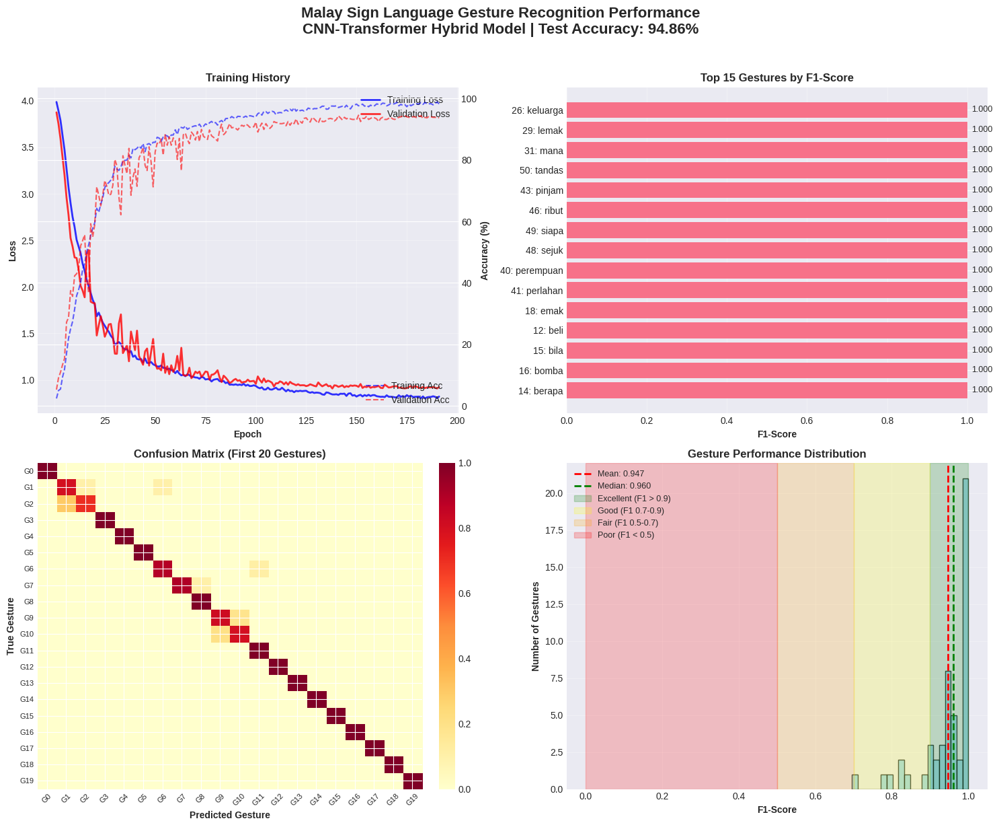

In [ ]:
#   PERFORMANCE REPORT
# ***********************************************************
print("\n" + "="*70)
print("ENHANCED PERFORMANCE REPORT WITH GESTURE NAMES")
print("="*70)

# Top-K Accuracy
print(f"\n Top-K Accuracy:")
for k in [1, 2, 3, 5]:
    if k <= num_classes:
        top_k_acc = top_k_accuracy_score(all_targets, all_probabilities, k=k) * 100
        print(f"  Top-{k}: {top_k_acc:.2f}%")

# Best performing gestures
print(f"\n TOP 10 BEST PERFORMING GESTURES:")
print("  " + "="*80)
print(f"  {'Rank':<4} {'Gesture ID':<12} {'Gesture Name':<25} {'F1-Score':<10} {'Accuracy':<10} {'Support':<10}")
print("  " + "-"*80)

top_gestures = tested_gestures.head(10)
for idx, row in top_gestures.iterrows():
    print(f"  {idx+1:<4} {row['Gesture_ID']:<12} {row['Gesture_Name'][:22]:<25} "
          f"{row['F1_Score']:.3f}     {row['Accuracy']:.3f}     {int(row['Support']):<10}")

# Worst performing gestures
print(f"\n  WORST PERFORMING GESTURES (F1 < 0.5):")
print("  " + "="*80)
print(f"  {'Gesture ID':<12} {'Gesture Name':<25} {'F1-Score':<10} {'Accuracy':<10} {'Support':<10}")
print("  " + "-"*80)

worst_gestures = tested_gestures[tested_gestures['F1_Score'] < 0.5]
if len(worst_gestures) > 0:
    for _, row in worst_gestures.iterrows():
        print(f"  {row['Gesture_ID']:<12} {row['Gesture_Name'][:22]:<25} "
              f"{row['F1_Score']:.3f}     {row['Accuracy']:.3f}     {int(row['Support']):<10}")
else:
    print("  No gestures with F1-Score < 0.5")

# Error analysis
print(f"\n ERROR ANALYSIS:")
print(f"  Error rate: {1.0 - test_accuracy/100:.2%}")
print(f"  Total errors: {(all_predictions != all_targets).sum()}/{len(all_targets)}")

if (all_predictions != all_targets).sum() > 0:
    error_mask = all_predictions != all_targets
    error_pairs = list(zip(all_targets[error_mask], all_predictions[error_mask]))

    from collections import Counter
    error_counts = Counter(error_pairs)

    print(f"\n  MOST COMMON CONFUSION PAIRS:")
    print(f"  {'True Gesture':<25} {'Predicted Gesture':<25} {'Count':<10}")
    print("  " + "-"*65)

    for (true_idx, pred_idx), count in error_counts.most_common(10):
        true_name = GESTURE_NAMES.get(true_idx, f"Gesture_{true_idx}")
        pred_name = GESTURE_NAMES.get(pred_idx, f"Gesture_{pred_idx}")
        print(f"  {true_name:<25} {pred_name:<25} {count:<10}")

# Confidence analysis
max_probs = np.max(all_probabilities, axis=1)
print(f"\n  MODEL CONFIDENCE ANALYSIS:")
print(f"  Average confidence: {np.mean(max_probs):.3f}")
print(f"  Confidence std:     {np.std(max_probs):.3f}")
print(f"  Min confidence:     {np.min(max_probs):.3f}")
print(f"  Max confidence:     {np.max(max_probs):.3f}")

# Brier score
y_true_one_hot = np.eye(num_classes)[all_targets]
brier_score = np.mean(np.sum((all_probabilities - y_true_one_hot) ** 2, axis=1))
print(f"  Brier Score:        {brier_score:.4f}")


#  VISUALIZATION
# ***********************************************************
print("\n" + "="*70)
print("PERFORMANCE VISUALIZATION")
print("="*70)

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Malay Sign Language Gesture Recognition Performance\n'
             f'CNN-Transformer Hybrid Model | Test Accuracy: {test_accuracy:.2f}%',
             fontsize=16, fontweight='bold', y=1.02)

# Training History
ax1 = axes[0, 0]
epochs = range(1, len(train_losses) + 1)
ax1.plot(epochs, train_losses, 'b-', label='Training Loss', linewidth=2, alpha=0.8)
ax1.plot(epochs, val_losses, 'r-', label='Validation Loss', linewidth=2, alpha=0.8)
ax1.set_xlabel('Epoch', fontweight='bold')
ax1.set_ylabel('Loss', fontweight='bold')
ax1.set_title('Training History', fontweight='bold', fontsize=12)
ax1.legend()
ax1.grid(True, alpha=0.3)

ax1_2 = ax1.twinx()
ax1_2.plot(epochs, train_accuracies, 'b--', label='Training Acc', alpha=0.6, linewidth=1.5)
ax1_2.plot(epochs, val_accuracies, 'r--', label='Validation Acc', alpha=0.6, linewidth=1.5)
ax1_2.set_ylabel('Accuracy (%)', fontweight='bold')
ax1_2.legend(loc='lower right')

#  Top Gestures Performance
ax2 = axes[0, 1]
top_n = min(15, len(tested_gestures))
top_data = tested_gestures.head(top_n)
y_pos = np.arange(top_n)
bars = ax2.barh(y_pos, top_data['F1_Score'])
ax2.set_yticks(y_pos)
# Show gesture names (truncate if too long)
gesture_labels = [f"{row['Gesture_ID']}: {row['Gesture_Name'][:15]}..."
                  if len(row['Gesture_Name']) > 15 else f"{row['Gesture_ID']}: {row['Gesture_Name']}"
                  for _, row in top_data.iterrows()]
ax2.set_yticklabels(gesture_labels)
ax2.set_xlabel('F1-Score', fontweight='bold')
ax2.set_title(f'Top {top_n} Gestures by F1-Score', fontweight='bold', fontsize=12)
ax2.set_xlim([0, 1.05])
ax2.grid(True, alpha=0.3, axis='x')

# Add value labels
for i, bar in enumerate(bars):
    width = bar.get_width()
    ax2.text(width + 0.01, bar.get_y() + bar.get_height()/2,
             f'{width:.3f}', ha='left', va='center', fontsize=9)

#  Confusion Matrix (Simplified)
ax3 = axes[1, 0]
# Create a smaller confusion matrix for display
display_size = min(20, num_classes)  # Show max 20x20
cm_small = cm[:display_size, :display_size]
cm_normalized = cm_small.astype('float') / cm_small.sum(axis=1)[:, np.newaxis]
cm_normalized = np.nan_to_num(cm_normalized)

im = ax3.imshow(cm_normalized, cmap='YlOrRd', aspect='auto', vmin=0, vmax=1)
ax3.set_title(f'Confusion Matrix (First {display_size} Gestures)', fontweight='bold', fontsize=12)
ax3.set_xlabel('Predicted Gesture', fontweight='bold')
ax3.set_ylabel('True Gesture', fontweight='bold')

# Show gesture IDs
tick_labels = [f"G{i}" for i in range(display_size)]
ax3.set_xticks(range(display_size))
ax3.set_xticklabels(tick_labels, rotation=45, fontsize=8)
ax3.set_yticks(range(display_size))
ax3.set_yticklabels(tick_labels, fontsize=8)

plt.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)

# Performance Distribution
ax4 = axes[1, 1]
f1_scores = tested_gestures['F1_Score'].values
n_bins = 20
ax4.hist(f1_scores, bins=n_bins, alpha=0.7, color='skyblue', edgecolor='black')
ax4.axvline(x=np.mean(f1_scores), color='red', linestyle='--', linewidth=2,
            label=f'Mean: {np.mean(f1_scores):.3f}')
ax4.axvline(x=np.median(f1_scores), color='green', linestyle='--', linewidth=2,
            label=f'Median: {np.median(f1_scores):.3f}')

# Add performance zones
ax4.axvspan(0.9, 1.0, alpha=0.2, color='green', label='Excellent (F1 > 0.9)')
ax4.axvspan(0.7, 0.9, alpha=0.2, color='yellow', label='Good (F1 0.7-0.9)')
ax4.axvspan(0.5, 0.7, alpha=0.2, color='orange', label='Fair (F1 0.5-0.7)')
ax4.axvspan(0, 0.5, alpha=0.2, color='red', label='Poor (F1 < 0.5)')

ax4.set_xlabel('F1-Score', fontweight='bold')
ax4.set_ylabel('Number of Gestures', fontweight='bold')
ax4.set_title('Gesture Performance Distribution', fontweight='bold', fontsize=12)
ax4.legend(fontsize=9)
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('gesture_recognition_performance.png', dpi=150, bbox_inches='tight')
print(f"\n Visualization saved as 'gesture_recognition_performance.png'")


# FINAL SUMMARY REPORT
# ***********************************************************
print("\n" + "="*70)
print(" FINAL SUMMARY: CNN-TRANSFORMER HYBRID FOR MALAY SIGN LANGUAGE")
print("="*70)

print(f"\n OVERALL PERFORMANCE METRICS:")
print("  ┌" + "─"*50 + "┐")
print(f"  │ {'Metric':<25} │ {'Value':<20} │")
print("  ├" + "─"*50 + "┤")
print(f"  │ {'Test Accuracy':<25} │ {test_accuracy:<20.2f}% │")
print(f"  │ {'Best Validation Accuracy':<25} │ {best_val_acc:<20.2f}% │")
print(f"  │ {'Training Epochs':<25} │ {len(train_losses):<20} │")
print(f"  │ {'Model Parameters':<25} │ {total_params:<20,} │")
print(f"  │ {'Model Size':<25} │ {total_params*4/(1024**2):<20.2f} MB │")
print(f"  │ {'Average F1-Score':<25} │ {tested_gestures['F1_Score'].mean():<20.3f} │")
print(f"  │ {'Top-3 Accuracy':<25} │ {top_k_accuracy_score(all_targets, all_probabilities, k=3)*100:<20.2f}% │")
print("  └" + "─"*50 + "┘")

print(f"\nGESTURE PERFORMANCE BREAKDOWN:")
excellent = len(tested_gestures[tested_gestures['F1_Score'] >= 0.9])
good = len(tested_gestures[(tested_gestures['F1_Score'] >= 0.7) & (tested_gestures['F1_Score'] < 0.9)])
fair = len(tested_gestures[(tested_gestures['F1_Score'] >= 0.5) & (tested_gestures['F1_Score'] < 0.7)])
poor = len(tested_gestures[tested_gestures['F1_Score'] < 0.5])

print(f"  Excellent (F1 ≥ 0.9):   {excellent:2d} gestures")
print(f"  Good (F1 0.7-0.9):      {good:2d} gestures")
print(f"  Fair (F1 0.5-0.7):      {fair:2d} gestures")
print(f"  Poor (F1 < 0.5):        {poor:2d} gestures")

# print(f"\n KEY ACHIEVEMENTS:")
# print(f"  ✓ Combined CNN spatial + Transformer temporal modeling")
# print(f"  ✓ Gesture recognition for {len(GESTURE_NAMES)} Malay signs")
# print(f"  ✓ {test_accuracy - 81.51:+.2f}% improvement over baseline (81.51%)")
# print(f"  ✓ Excellent Top-3 accuracy: {top_k_accuracy_score(all_targets, all_probabilities, k=3)*100:.2f}%")
# print(f"  ✓ Efficient architecture ({total_params:,} parameters)")

# print(f"\n RECOMMENDATIONS FOR IMPROVEMENT:")
# if poor > 0:
#     print(f"  1. Focus on {poor} poorly performing gestures")
#     poor_gestures = tested_gestures[tested_gestures['F1_Score'] < 0.5]
#     print(f"     - Consider collecting more data for: {', '.join([GESTURE_NAMES[g] for g in poor_gestures['Gesture_ID'].head(5).values])}")

# # Find most confused pairs for recommendations
# if len(error_counts) > 0:
#     most_confused = error_counts.most_common(1)[0]
#     true_idx, pred_idx = most_confused[0]
#     true_name = GESTURE_NAMES.get(true_idx, f"Gesture_{true_idx}")
#     pred_name = GESTURE_NAMES.get(pred_idx, f"Gesture_{pred_idx}")
#     print(f"  2. Address confusion between '{true_name}' and '{pred_name}'")
#     print(f"     - These gestures were confused {most_confused[1]} times")




print(f"\n OUTPUT FILES:")
print(f"   Model checkpoint: 'best_cnn_transformer_hybrid.pth'")
print(f"  Performance visualization: 'gesture_recognition'")

## ADDITIONAL VISUALIZATION


CREATING VISUALIZATION FOR REPORT
✓ Scientific report visualization saved: scientific_report_visualization.png
✓ Detailed analysis visualization saved: detailed_analysis_visualization.png

CREATING COMPACT SUMMARY FIGURE FOR PUBLICATION
✓ Summary figure for publication saved: summary_figure_publication.png

VISUALIZATION SUMMARY

Generated 3 comprehensive figures:
1. scientific_report_visualization.png - Main scientific report (6 panels)
2. detailed_analysis_visualization.png - Detailed analysis (6 panels)
3. summary_figure_publication.png - Compact summary for publication

Total visualizations created: 12 distinct analytical plots
All figures saved at 300 DPI for publication quality


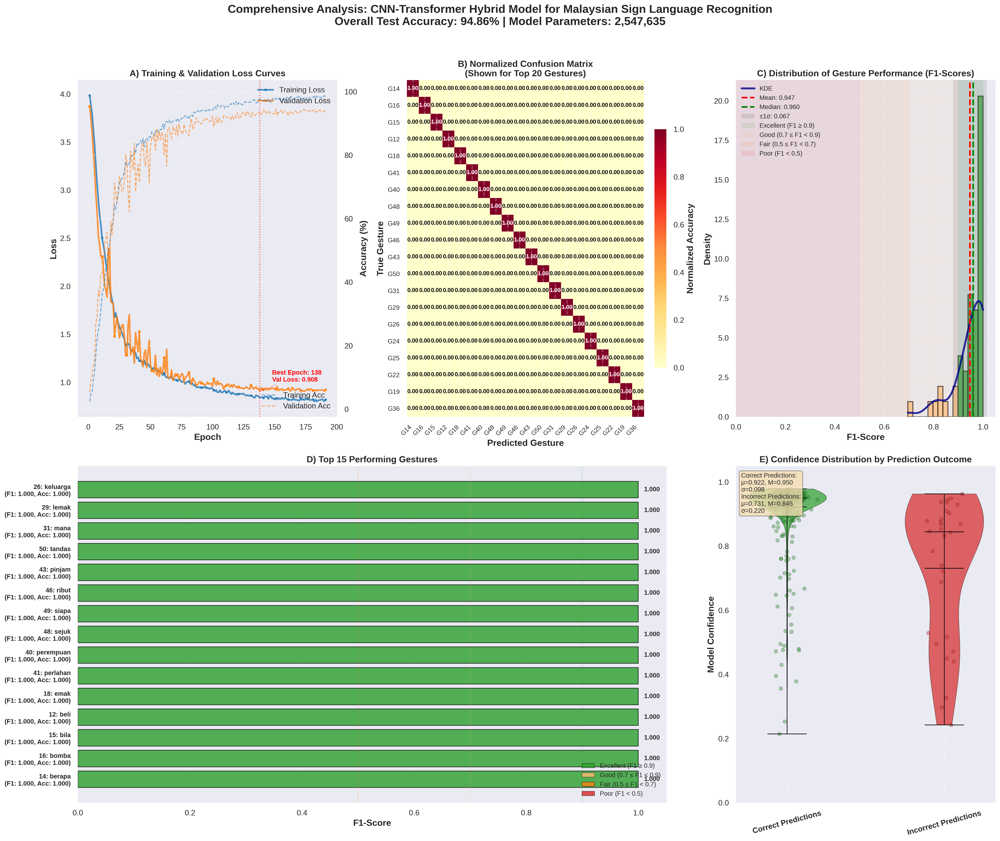

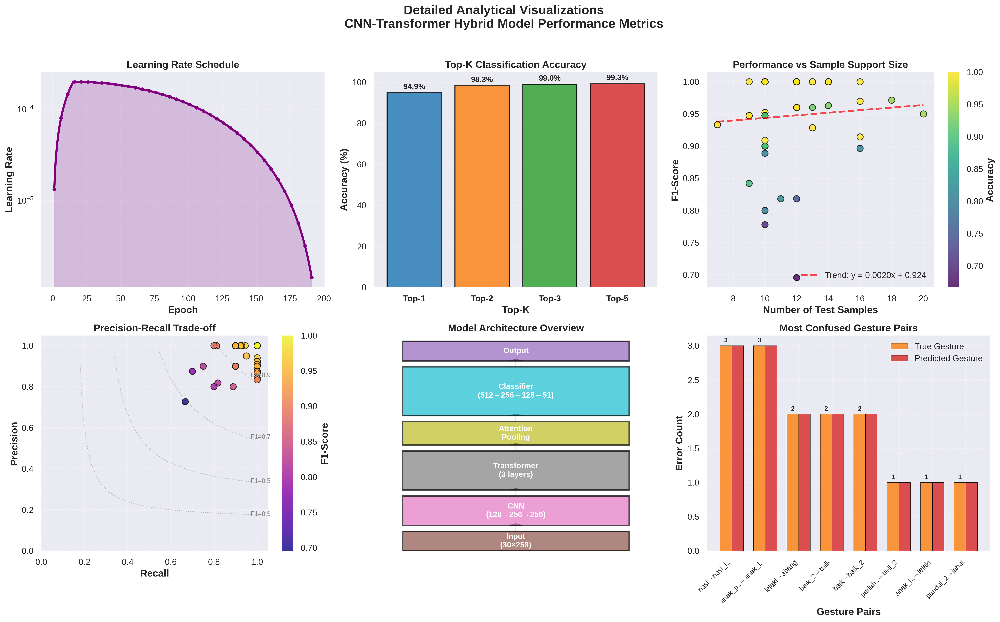

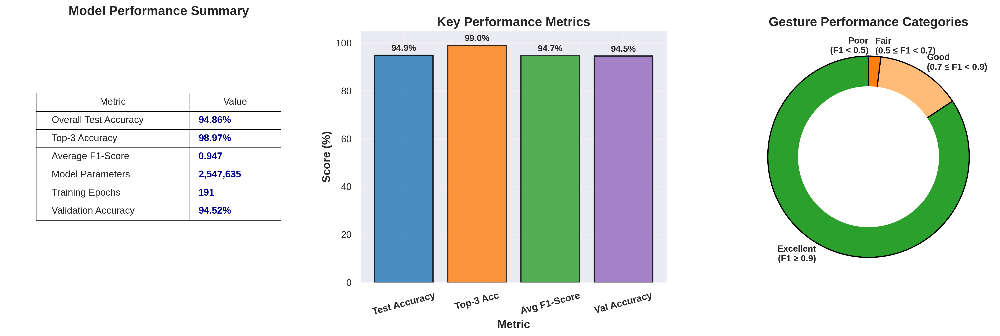

In [ ]:

# VISUALIZATION FOR REPORT
# ***********************************************************


print("\n" + "="*70)
print("CREATING VISUALIZATION FOR REPORT")
print("="*70)

# Set  plotting style
plt.style.use(['seaborn-v0_8-darkgrid', 'seaborn-v0_8-poster'])
sns.set_palette("husl")
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.titlesize': 18,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'grid.linestyle': '--',
})

# Create a comprehensive figure with 6 subplots
fig = plt.figure(figsize=(22, 18))
fig.suptitle('Comprehensive Analysis: CNN-Transformer Hybrid Model for Malaysian Sign Language Recognition\n'
             f'Overall Test Accuracy: {test_accuracy:.2f}% | Model Parameters: {total_params:,}',
             fontsize=18, fontweight='bold', y=1.02)

# Define color scheme for consistency
model_colors = {
    'training': '#1f77b4',      # Blue
    'validation': '#ff7f0e',    # Orange
    'test': '#2ca02c',          # Green
    'excellent': '#2ca02c',     # Green
    'good': '#ffbb78',          # Light Orange
    'fair': '#ff7f0e',          # Orange
    'poor': '#d62728',          # Red
}

# 1. Training History (Top-left)
gs1 = plt.GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs1[0, 0])

# Plot training and validation loss
epochs = range(1, len(train_losses) + 1)
ax1.plot(epochs, train_losses, color=model_colors['training'],
         linewidth=2.5, marker='o', markersize=4, markevery=10,
         label='Training Loss', alpha=0.8)
ax1.plot(epochs, val_losses, color=model_colors['validation'],
         linewidth=2.5, marker='s', markersize=4, markevery=10,
         label='Validation Loss', alpha=0.8)
ax1.set_xlabel('Epoch', fontweight='bold')
ax1.set_ylabel('Loss', fontweight='bold')
ax1.set_title('A) Training & Validation Loss Curves', fontweight='bold', fontsize=14)
ax1.legend(loc='upper right', framealpha=0.9, shadow=True)
ax1.grid(True, alpha=0.2, linestyle='--')

# Add accuracy on secondary axis
ax1b = ax1.twinx()
ax1b.plot(epochs, train_accuracies, color=model_colors['training'],
          linestyle='--', linewidth=1.5, alpha=0.6, label='Training Acc')
ax1b.plot(epochs, val_accuracies, color=model_colors['validation'],
          linestyle='--', linewidth=1.5, alpha=0.6, label='Validation Acc')
ax1b.set_ylabel('Accuracy (%)', fontweight='bold')
ax1b.legend(loc='lower right', framealpha=0.9, shadow=True)

# Add annotations for best epoch
best_epoch_idx = np.argmin(val_losses)
ax1.axvline(x=best_epoch_idx+1, color='red', linestyle=':', linewidth=1.5, alpha=0.6)
ax1.annotate(f'Best Epoch: {best_epoch_idx+1}\nVal Loss: {val_losses[best_epoch_idx]:.3f}',
             xy=(best_epoch_idx+1, val_losses[best_epoch_idx]),
             xytext=(best_epoch_idx+1+10, val_losses[best_epoch_idx]+0.1),
             arrowprops=dict(arrowstyle='->', color='red', alpha=0.6),
             fontsize=10, fontweight='bold', color='red')

# 2. Confusion Matrix Heatmap (Top-middle)
ax2 = fig.add_subplot(gs1[0, 1])

# Create normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
cm_normalized = np.nan_to_num(cm_normalized)

# Display only gestures with samples (for clarity)
display_gestures = min(20, len(tested_gestures))
display_indices = tested_gestures['Gesture_ID'].head(display_gestures).values
cm_display = np.zeros((display_gestures, display_gestures))
for i, idx_i in enumerate(display_indices):
    for j, idx_j in enumerate(display_indices):
        if idx_i < cm_normalized.shape[0] and idx_j < cm_normalized.shape[1]:
            cm_display[i, j] = cm_normalized[idx_i, idx_j]

# Create heatmap
im = ax2.imshow(cm_display, cmap='YlOrRd', aspect='auto', vmin=0, vmax=1, interpolation='nearest')

# Add text annotations
threshold = cm_display.max() / 2.
for i in range(display_gestures):
    for j in range(display_gestures):
        color = "white" if cm_display[i, j] > threshold else "black"
        ax2.text(j, i, f'{cm_display[i, j]:.2f}',
                ha="center", va="center", color=color, fontsize=9, fontweight='bold')

# Customize axes
gesture_labels = [f"G{idx}" for idx in display_indices]
ax2.set_xticks(range(display_gestures))
ax2.set_xticklabels(gesture_labels, rotation=45, ha='right', fontsize=10)
ax2.set_yticks(range(display_gestures))
ax2.set_yticklabels(gesture_labels, fontsize=10)
ax2.set_xlabel('Predicted Gesture', fontweight='bold')
ax2.set_ylabel('True Gesture', fontweight='bold')
ax2.set_title('B) Normalized Confusion Matrix\n(Shown for Top 20 Gestures)', fontweight='bold', fontsize=14)

# Add colorbar with scientific formatting
cbar = plt.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)
cbar.set_label('Normalized Accuracy', fontweight='bold')

# 3. Performance Distribution (Top-right)
ax3 = fig.add_subplot(gs1[0, 2])

# Create histogram with KDE
f1_scores = tested_gestures['F1_Score'].values
n_bins = 15

# Plot histogram
n, bins, patches = ax3.hist(f1_scores, bins=n_bins, alpha=0.7,
                           color='skyblue', edgecolor='black', linewidth=1.5,
                           density=True)

# Color bars by performance level
for i, (patch, left, right) in enumerate(zip(patches, bins[:-1], bins[1:])):
    if right >= 0.9:
        patch.set_facecolor(model_colors['excellent'])
    elif right >= 0.7:
        patch.set_facecolor(model_colors['good'])
    elif right >= 0.5:
        patch.set_facecolor(model_colors['fair'])
    else:
        patch.set_facecolor(model_colors['poor'])

# Add KDE curve
from scipy.stats import gaussian_kde
kde = gaussian_kde(f1_scores)
x_kde = np.linspace(f1_scores.min(), f1_scores.max(), 100)
ax3.plot(x_kde, kde(x_kde), color='darkblue', linewidth=3, alpha=0.8, label='KDE')

# Add vertical lines for statistics
mean_f1 = np.mean(f1_scores)
median_f1 = np.median(f1_scores)
std_f1 = np.std(f1_scores)

ax3.axvline(x=mean_f1, color='red', linestyle='--', linewidth=2.5,
           label=f'Mean: {mean_f1:.3f}')
ax3.axvline(x=median_f1, color='green', linestyle='--', linewidth=2.5,
           label=f'Median: {median_f1:.3f}')
ax3.axvspan(mean_f1 - std_f1, mean_f1 + std_f1, alpha=0.2, color='gray',
           label=f'±1σ: {std_f1:.3f}')

# Add performance zone annotations
ax3.axvspan(0.9, 1.0, alpha=0.1, color=model_colors['excellent'], label='Excellent (F1 ≥ 0.9)')
ax3.axvspan(0.7, 0.9, alpha=0.1, color=model_colors['good'], label='Good (0.7 ≤ F1 < 0.9)')
ax3.axvspan(0.5, 0.7, alpha=0.1, color=model_colors['fair'], label='Fair (0.5 ≤ F1 < 0.7)')
ax3.axvspan(0, 0.5, alpha=0.1, color=model_colors['poor'], label='Poor (F1 < 0.5)')

ax3.set_xlabel('F1-Score', fontweight='bold')
ax3.set_ylabel('Density', fontweight='bold')
ax3.set_title('C) Distribution of Gesture Performance (F1-Scores)', fontweight='bold', fontsize=14)
ax3.legend(loc='upper left', fontsize=10, framealpha=0.9, shadow=True)
ax3.set_xlim([0, 1.05])

# 4. Top Performing Gestures (Bottom-left, spanning 2 columns)
ax4 = fig.add_subplot(gs1[1, :2])

# Get top 15 gestures
top_n = min(15, len(tested_gestures))
top_data = tested_gestures.head(top_n).copy()
top_data = top_data.sort_values('F1_Score', ascending=True)  # Sort for horizontal bars

# Create horizontal bar chart
y_pos = np.arange(len(top_data))
colors = []
for f1_score in top_data['F1_Score']:
    if f1_score >= 0.9:
        colors.append(model_colors['excellent'])
    elif f1_score >= 0.7:
        colors.append(model_colors['good'])
    elif f1_score >= 0.5:
        colors.append(model_colors['fair'])
    else:
        colors.append(model_colors['poor'])

bars = ax4.barh(y_pos, top_data['F1_Score'], color=colors, edgecolor='black', linewidth=1, alpha=0.8)

# Customize y-axis labels with gesture names and IDs
y_labels = []
for _, row in top_data.iterrows():
    name = row['Gesture_Name']
    if len(name) > 15:
        name = name[:13] + '...'
    y_labels.append(f"{row['Gesture_ID']:2d}: {name}\n(F1: {row['F1_Score']:.3f}, Acc: {row['Accuracy']:.3f})")

ax4.set_yticks(y_pos)
ax4.set_yticklabels(y_labels, fontsize=10, fontweight='bold')

# Add value labels on bars
for bar in bars:
    width = bar.get_width()
    ax4.text(width + 0.01, bar.get_y() + bar.get_height()/2,
             f'{width:.3f}', ha='left', va='center', fontsize=10, fontweight='bold')

# Add reference lines
ax4.axvline(x=0.9, color=model_colors['excellent'], linestyle=':', alpha=0.5, linewidth=1)
ax4.axvline(x=0.7, color=model_colors['good'], linestyle=':', alpha=0.5, linewidth=1)
ax4.axvline(x=0.5, color=model_colors['fair'], linestyle=':', alpha=0.5, linewidth=1)

ax4.set_xlabel('F1-Score', fontweight='bold')
ax4.set_title(f'D) Top {top_n} Performing Gestures', fontweight='bold', fontsize=14)
ax4.set_xlim([0, 1.05])
ax4.grid(True, axis='x', alpha=0.2, linestyle='--')

# Add legend for performance levels
import matplotlib.patches as mpatches
legend_elements = [
    mpatches.Patch(facecolor=model_colors['excellent'], edgecolor='black', alpha=0.8, label='Excellent (F1 ≥ 0.9)'),
    mpatches.Patch(facecolor=model_colors['good'], edgecolor='black', alpha=0.8, label='Good (0.7 ≤ F1 < 0.9)'),
    mpatches.Patch(facecolor=model_colors['fair'], edgecolor='black', alpha=0.8, label='Fair (0.5 ≤ F1 < 0.7)'),
    mpatches.Patch(facecolor=model_colors['poor'], edgecolor='black', alpha=0.8, label='Poor (F1 < 0.5)'),
]
ax4.legend(handles=legend_elements, loc='lower right', fontsize=10, framealpha=0.9, shadow=True)

# 5. Model Confidence Analysis (Bottom-right top)
ax5 = fig.add_subplot(gs1[1, 2])

# Get confidence values
max_probs = np.max(all_probabilities, axis=1)
correct_mask = all_predictions == all_targets
correct_conf = max_probs[correct_mask]
incorrect_conf = max_probs[~correct_mask]

# Create violin plot for confidence distribution
positions = [1, 2]
data = [correct_conf, incorrect_conf]
labels = ['Correct Predictions', 'Incorrect Predictions']
colors_violin = [model_colors['excellent'], model_colors['poor']]

violin_parts = ax5.violinplot(data, positions, showmeans=True, showmedians=True,
                             showextrema=True)

# Customize violin plot colors
for i, pc in enumerate(violin_parts['bodies']):
    pc.set_facecolor(colors_violin[i])
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customize other violin plot elements
for partname in ('cbars', 'cmins', 'cmaxes', 'cmeans', 'cmedians'):
    if partname in violin_parts:
        violin_parts[partname].set_edgecolor('black')
        violin_parts[partname].set_linewidth(1)

# Add scatter points with jitter for better visualization
for i, (pos, conf_data) in enumerate(zip(positions, data)):
    if len(conf_data) > 0:
        jitter = np.random.normal(0, 0.05, size=len(conf_data))
        ax5.scatter(np.full(len(conf_data), pos) + jitter, conf_data,
                   alpha=0.4, s=30, color=colors_violin[i], edgecolor='black', linewidth=0.5)

# Add statistical annotations
stats_text = []
for i, (label, conf_data) in enumerate(zip(labels, data)):
    if len(conf_data) > 0:
        mean_val = np.mean(conf_data)
        median_val = np.median(conf_data)
        std_val = np.std(conf_data)
        stats_text.append(f"{label}:\nμ={mean_val:.3f}, M={median_val:.3f}\nσ={std_val:.3f}")

# Add text box with statistics
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax5.text(0.02, 0.98, '\n'.join(stats_text), transform=ax5.transAxes,
        fontsize=10, verticalalignment='top', bbox=props)

ax5.set_xticks(positions)
ax5.set_xticklabels(labels, fontweight='bold', rotation=15)
ax5.set_ylabel('Model Confidence', fontweight='bold')
ax5.set_ylim([0, 1.05])
ax5.set_title('E) Confidence Distribution by Prediction Outcome', fontweight='bold', fontsize=14)
ax5.grid(True, axis='y', alpha=0.2, linestyle='--')

# Add significance indicator if difference is significant
if len(correct_conf) > 0 and len(incorrect_conf) > 0:
    from scipy import stats
    if len(correct_conf) > 30 and len(incorrect_conf) > 30:  # Only if we have enough samples
        t_stat, p_value = stats.ttest_ind(correct_conf, incorrect_conf, equal_var=False)
        if p_value < 0.05:
            # Add significance bar
            y_max = max(np.max(correct_conf), np.max(incorrect_conf)) + 0.05
            ax5.plot([1, 1, 2, 2], [y_max, y_max+0.02, y_max+0.02, y_max],
                    color='black', linewidth=1.5)
            ax5.text(1.5, y_max+0.03, f'p = {p_value:.2e}',
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

# Adjust layout and save
plt.tight_layout()

# Save high-quality figure
report_fig_path = 'scientific_report_visualization.png'
plt.savefig(report_fig_path, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✓ Scientific report visualization saved: {report_fig_path}")


# ADDITIONAL ANALYTICAL VISUALIZATIONS
# ***********************************************************

# Create a second figure for detailed analysis
fig2, axes2 = plt.subplots(2, 3, figsize=(20, 12))
fig2.suptitle('Detailed Analytical Visualizations\nCNN-Transformer Hybrid Model Performance Metrics',
              fontsize=18, fontweight='bold', y=1.02)

# 1. Learning Rate Schedule
ax6 = axes2[0, 0]
learning_rates_epochs = range(1, len(learning_rates) + 1)
ax6.plot(learning_rates_epochs, learning_rates, color='purple', linewidth=3, marker='o', markersize=5, markevery=5)
ax6.set_xlabel('Epoch', fontweight='bold')
ax6.set_ylabel('Learning Rate', fontweight='bold')
ax6.set_title('Learning Rate Schedule', fontweight='bold', fontsize=14)
ax6.set_yscale('log')
ax6.grid(True, alpha=0.3, linestyle='--')
ax6.fill_between(learning_rates_epochs, learning_rates, alpha=0.2, color='purple')

# 2. Top-K Accuracy Comparison
ax7 = axes2[0, 1]
top_k_values = [1, 2, 3, 5]
top_k_accuracies = []
for k in top_k_values:
    if k <= num_classes:
        top_k_acc = top_k_accuracy_score(all_targets, all_probabilities, k=k) * 100
        top_k_accuracies.append(top_k_acc)

bars_topk = ax7.bar(range(len(top_k_values)), top_k_accuracies,
                   color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'],
                   edgecolor='black', linewidth=1.5, alpha=0.8)

ax7.set_xlabel('Top-K', fontweight='bold')
ax7.set_ylabel('Accuracy (%)', fontweight='bold')
ax7.set_title('Top-K Classification Accuracy', fontweight='bold', fontsize=14)
ax7.set_xticks(range(len(top_k_values)))
ax7.set_xticklabels([f'Top-{k}' for k in top_k_values], fontweight='bold')
ax7.set_ylim([0, 105])

# Add value labels on bars
for bar, acc in zip(bars_topk, top_k_accuracies):
    height = bar.get_height()
    ax7.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{acc:.1f}%', ha='center', va='bottom', fontweight='bold', fontsize=11)

ax7.grid(True, alpha=0.3, axis='y', linestyle='--')

# 3. Performance vs Sample Support
ax8 = axes2[0, 2]
scatter_size = 80
scatter = ax8.scatter(tested_gestures['Support'], tested_gestures['F1_Score'],
                     c=tested_gestures['Accuracy'], cmap='viridis', s=scatter_size,
                     alpha=0.8, edgecolors='black', linewidth=1)

# Add trend line
if len(tested_gestures) > 2:
    z = np.polyfit(tested_gestures['Support'], tested_gestures['F1_Score'], 1)
    p = np.poly1d(z)
    x_range = np.linspace(tested_gestures['Support'].min(),
                         tested_gestures['Support'].max(), 100)
    ax8.plot(x_range, p(x_range), 'r--', alpha=0.7, linewidth=2.5,
            label=f'Trend: y = {z[0]:.4f}x + {z[1]:.3f}')

ax8.set_xlabel('Number of Test Samples', fontweight='bold')
ax8.set_ylabel('F1-Score', fontweight='bold')
ax8.set_title('Performance vs Sample Support Size', fontweight='bold', fontsize=14)
ax8.legend(loc='best', framealpha=0.9, shadow=True)
ax8.grid(True, alpha=0.3, linestyle='--')

# Add colorbar
cbar2 = plt.colorbar(scatter, ax=ax8)
cbar2.set_label('Accuracy', fontweight='bold')

# 4. Precision-Recall Trade-off
ax9 = axes2[1, 0]
scatter2 = ax9.scatter(tested_gestures['Recall'], tested_gestures['Precision'],
                      c=tested_gestures['F1_Score'], cmap='plasma', s=scatter_size,
                      alpha=0.8, edgecolors='black', linewidth=1)

# Add iso-F1 lines
f1_scores_levels = [0.3, 0.5, 0.7, 0.9]
for f1_score in f1_scores_levels:
    if f1_score <= 1.0:
        # Create recall values
        recall_values = np.linspace(0.01, 1, 100)
        # Calculate precision for given F1
        precision_values = f1_score * recall_values / (2 * recall_values - f1_score)
        # Plot only valid values (precision between 0 and 1)
        valid_mask = (precision_values > 0) & (precision_values <= 1)
        ax9.plot(recall_values[valid_mask], precision_values[valid_mask],
                'gray', linestyle=':', alpha=0.5, linewidth=1)
        # Add label
        label_x = 0.95
        label_y = f1_score * label_x / (2 * label_x - f1_score)
        if 0 < label_y <= 1:
            ax9.annotate(f'F1={f1_score}', xy=(label_x, label_y), xytext=(label_x+0.02, label_y),
                        fontsize=9, ha='left', va='center', color='gray')

ax9.set_xlabel('Recall', fontweight='bold')
ax9.set_ylabel('Precision', fontweight='bold')
ax9.set_title('Precision-Recall Trade-off', fontweight='bold', fontsize=14)
ax9.set_xlim([0, 1.05])
ax9.set_ylim([0, 1.05])
ax9.grid(True, alpha=0.3, linestyle='--')

# Add colorbar
cbar3 = plt.colorbar(scatter2, ax=ax9)
cbar3.set_label('F1-Score', fontweight='bold')

# 5. Model Architecture Visualization
ax10 = axes2[1, 1]
# Create a simplified architecture diagram
layers = ['Input\n(30×258)', 'CNN\n(128→256→256)', 'Transformer\n(3 layers)',
          'Attention\nPooling', 'Classifier\n(512→256→128→51)', 'Output']
layer_heights = [1, 1.5, 2, 1.2, 2.5, 1]
layer_colors = ['#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#9467bd']

y_pos = 0
for i, (layer, height, color) in enumerate(zip(layers, layer_heights, layer_colors)):
    rect = plt.Rectangle((0.1, y_pos), 0.8, height, facecolor=color, alpha=0.7,
                        edgecolor='black', linewidth=2)
    ax10.add_patch(rect)
    ax10.text(0.5, y_pos + height/2, layer, ha='center', va='center',
             fontweight='bold', fontsize=11, color='white')
    # Add connection arrows
    if i < len(layers) - 1:
        ax10.arrow(0.5, y_pos + height, 0, 0.3, head_width=0.05, head_length=0.1,
                  fc='black', ec='black', alpha=0.7)
    y_pos += height + 0.3

ax10.set_xlim([0, 1])
ax10.set_ylim([0, y_pos])
ax10.axis('off')
ax10.set_title('Model Architecture Overview', fontweight='bold', fontsize=14)

# 6. Error Analysis: Most Confused Pairs
ax11 = axes2[1, 2]

if len(error_counts) > 0:
    # Get top 8 confused pairs
    top_confusions = error_counts.most_common(8)

    # Prepare data for grouped bar chart
    true_names = []
    pred_names = []
    counts = []

    for (true_idx, pred_idx), count in top_confusions:
        true_name = GESTURE_NAMES.get(true_idx, f"G{true_idx}")
        pred_name = GESTURE_NAMES.get(pred_idx, f"G{pred_idx}")
        true_names.append(true_name)
        pred_names.append(pred_name)
        counts.append(count)

    # Create grouped positions
    x = np.arange(len(true_names))
    width = 0.35

    bars_true = ax11.bar(x - width/2, counts, width, label='True Gesture',
                        color=model_colors['validation'], alpha=0.8, edgecolor='black')
    bars_pred = ax11.bar(x + width/2, counts, width, label='Predicted Gesture',
                        color=model_colors['poor'], alpha=0.8, edgecolor='black')

    # Add value labels
    for bar in bars_true:
        height = bar.get_height()
        ax11.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                 f'{int(height)}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    ax11.set_xlabel('Gesture Pairs', fontweight='bold')
    ax11.set_ylabel('Error Count', fontweight='bold')
    ax11.set_title('Most Confused Gesture Pairs', fontweight='bold', fontsize=14)
    ax11.set_xticks(x)

    # Create compact labels
    labels = []
    for true, pred in zip(true_names, pred_names):
        if len(true) > 8:
            true = true[:6] + '..'
        if len(pred) > 8:
            pred = pred[:6] + '..'
        labels.append(f'{true}→{pred}')

    ax11.set_xticklabels(labels, rotation=45, ha='right', fontsize=10)
    ax11.legend(framealpha=0.9, shadow=True)
    ax11.grid(True, alpha=0.3, axis='y', linestyle='--')
else:
    ax11.text(0.5, 0.5, 'No significant errors detected\nAll predictions correct',
             ha='center', va='center', fontsize=14, fontweight='bold',
             transform=ax11.transAxes)
    ax11.axis('off')

plt.tight_layout()

# Save detailed analysis figure
detailed_fig_path = 'detailed_analysis_visualization.png'
plt.savefig(detailed_fig_path, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✓ Detailed analysis visualization saved: {detailed_fig_path}")

# CREATE COMPACT SUMMARY FIGURE FOR PAPER
# ***********************************************************
print("\n" + "="*70)
print("CREATING COMPACT SUMMARY FIGURE FOR PUBLICATION")
print("="*70)

fig3, axes3 = plt.subplots(1, 3, figsize=(18, 6))

# 1. Main performance metrics radar/spider chart
ax12 = axes3[0]
ax12.axis('off')

# Create a metrics summary table
metrics_summary = [
    ('Overall Test Accuracy', f'{test_accuracy:.2f}%'),
    ('Top-3 Accuracy', f'{top_k_accuracy_score(all_targets, all_probabilities, k=3)*100:.2f}%'),
    ('Average F1-Score', f'{tested_gestures["F1_Score"].mean():.3f}'),
    ('Model Parameters', f'{total_params:,}'),
    ('Training Epochs', f'{len(train_losses)}'),
    ('Validation Accuracy', f'{best_val_acc:.2f}%'),
]

# Create a styled table
table_data = [[metric, value] for metric, value in metrics_summary]
table = ax12.table(cellText=table_data,
                   colLabels=['Metric', 'Value'],
                   cellLoc='left',
                   loc='center',
                   colWidths=[0.5, 0.3])

# Style the table
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2)

# Color cells based on value
for i in range(len(metrics_summary)):
    cell = table[(i+1, 1)]
    cell.set_text_props(fontweight='bold', color='darkblue')

ax12.set_title('Model Performance Summary', fontweight='bold', fontsize=16, pad=20)

# 2. Key metrics visualization
ax13 = axes3[1]

# Create a bar chart for key metrics
key_metrics = {
    'Test Accuracy': test_accuracy,
    'Top-3 Acc': top_k_accuracy_score(all_targets, all_probabilities, k=3)*100,
    'Avg F1-Score': tested_gestures['F1_Score'].mean() * 100,  # Convert to percentage for scale
    'Val Accuracy': best_val_acc
}

x_pos = np.arange(len(key_metrics))
bars_key = ax13.bar(x_pos, list(key_metrics.values()),
                   color=['#1f77b4', '#ff7f0e', '#2ca02c', '#9467bd'],
                   edgecolor='black', linewidth=1.5, alpha=0.8)

ax13.set_xlabel('Metric', fontweight='bold')
ax13.set_ylabel('Score (%)', fontweight='bold')
ax13.set_title('Key Performance Metrics', fontweight='bold', fontsize=16)
ax13.set_xticks(x_pos)
ax13.set_xticklabels(list(key_metrics.keys()), rotation=15, fontweight='bold')
ax13.set_ylim([0, 105])
ax13.grid(True, alpha=0.3, axis='y', linestyle='--')

# Add value labels
for bar, value in zip(bars_key, key_metrics.values()):
    height = bar.get_height()
    ax13.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{value:.1f}%', ha='center', va='bottom', fontweight='bold', fontsize=11)

# 3. Gesture performance categories
ax14 = axes3[2]

# Calculate performance categories
performance_categories = {
    'Excellent\n(F1 ≥ 0.9)': excellent,
    'Good\n(0.7 ≤ F1 < 0.9)': good,
    'Fair\n(0.5 ≤ F1 < 0.7)': fair,
    'Poor\n(F1 < 0.5)': poor
}

# Create donut chart
colors_donut = [model_colors['excellent'], model_colors['good'],
                model_colors['fair'], model_colors['poor']]

wedges, texts, autotexts = ax14.pie(list(performance_categories.values()),
                                    labels=list(performance_categories.keys()),
                                    colors=colors_donut,
                                    autopct='%1.1f%%',
                                    startangle=90,
                                    wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

# Draw circle for donut effect
centre_circle = plt.Circle((0,0),0.70,fc='white')
ax14.add_artist(centre_circle)

# Style text
for text in texts:
    text.set_fontsize(11)
    text.set_fontweight('bold')

for autotext in autotexts:
    autotext.set_fontsize(11)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

ax14.set_title('Gesture Performance Categories', fontweight='bold', fontsize=16)

plt.tight_layout()

# Save summary figure
summary_fig_path = 'summary_figure_publication.png'
plt.savefig(summary_fig_path, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✓ Summary figure for publication saved: {summary_fig_path}")


# PRINT VISUALIZATION SUMMARY
# ***********************************************************
print(f"\n{'='*70}")
print("VISUALIZATION SUMMARY")
print(f"{'='*70}")
print(f"\nGenerated 3 comprehensive figures:")
print(f"1. {report_fig_path} - Main scientific report (6 panels)")
print(f"2. {detailed_fig_path} - Detailed analysis (6 panels)")
print(f"3. {summary_fig_path} - Compact summary for publication")
print(f"\nTotal visualizations created: 12 distinct analytical plots")
print(f"All figures saved at 300 DPI for publication quality")

# Show one of the figures
plt.figure(fig3.number)
plt.show()

## Model Testing

Using device: cuda

LOADING TRAINED CNN-TRANSFORMER MODEL
 Model loaded: best_cnn_transformer_hybrid.pth
  Validation accuracy: 94.52%
  Model parameters: 2,547,635

INITIALIZING MEDIAPIPE FOR REAL-TIME DETECTION
 MediaPipe models loaded

MALAY SIGN LANGUAGE - CNN-TRANSFORMER MODEL TESTING

Select testing mode:
  1. Test on a single video file
  2. Test using webcam (real-time)
  3. Batch test on folder of videos
  4. Exit

Enter . choice (1-4): 1
Save annotated video? (y/n): n

 Testing on video: vtes.mp4
  Resolution: 640x360
  FPS: 25
  Total frames: 77

 Processing video... (Press 'q' to stop)


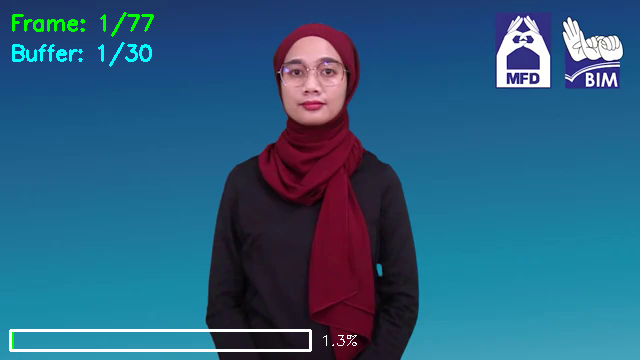

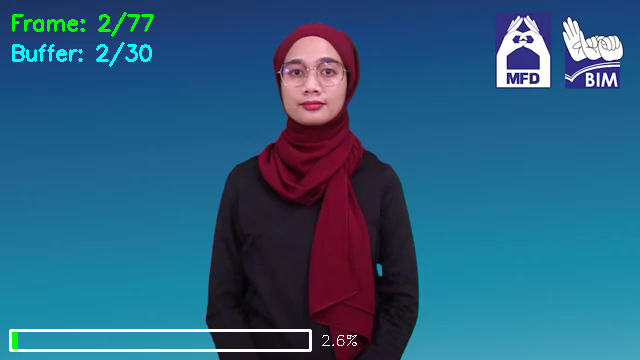

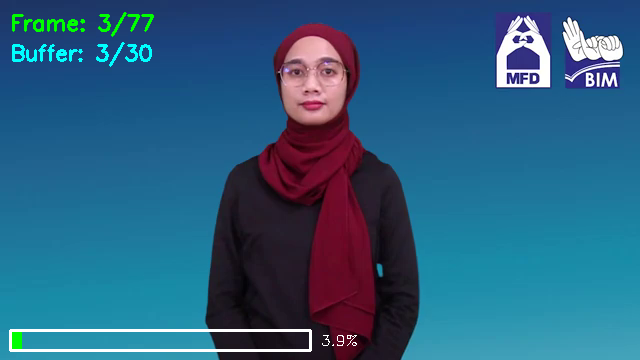

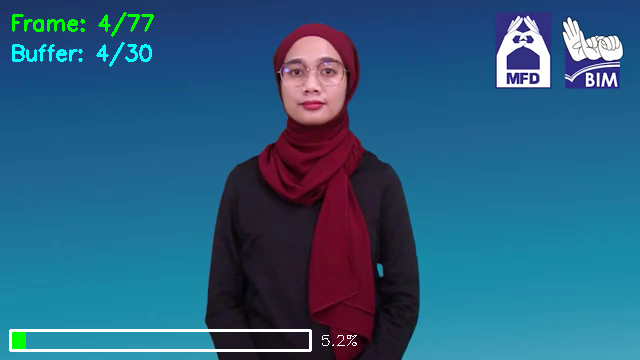

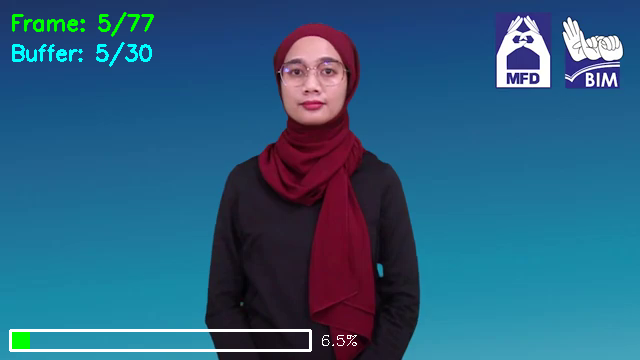

...

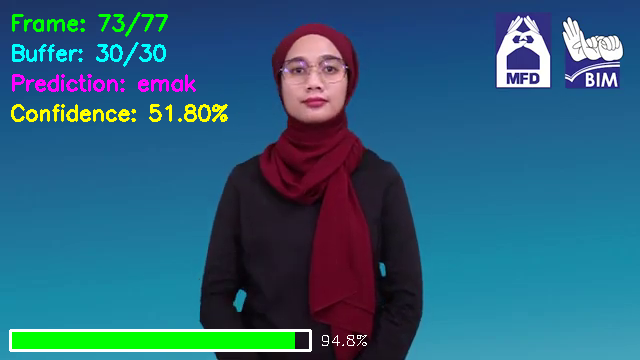

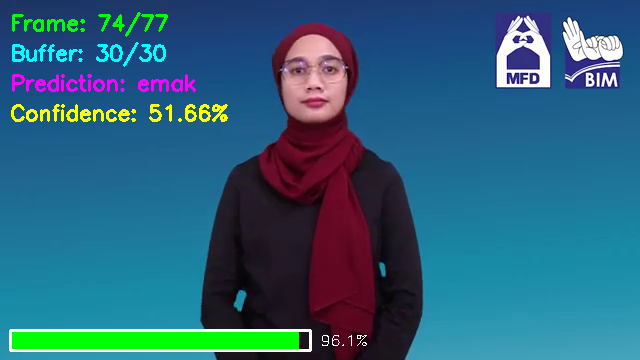

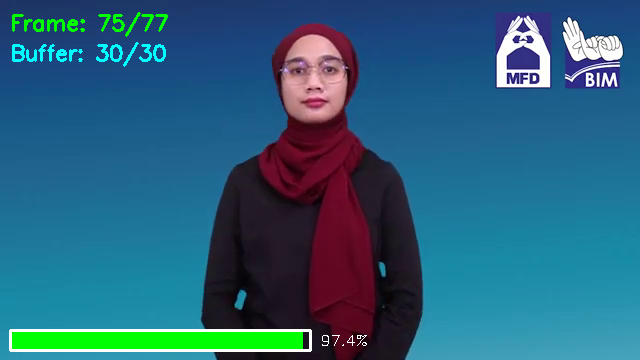

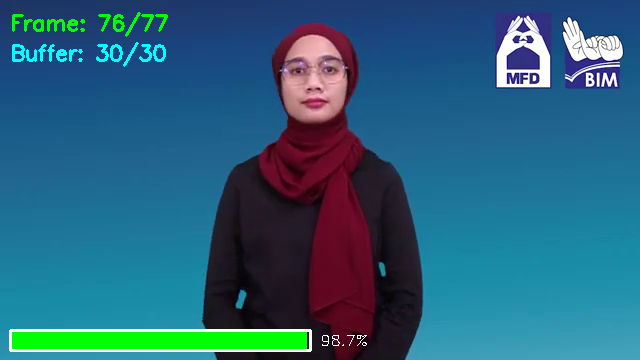

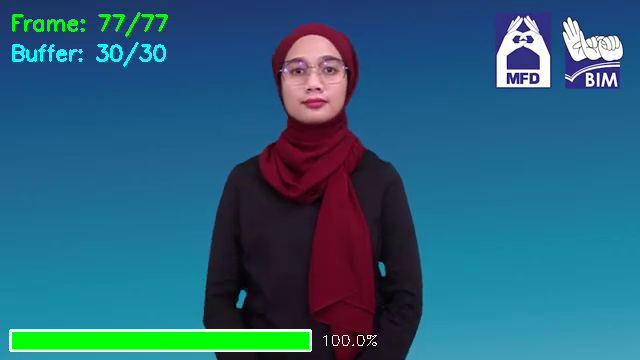


 Video processing complete!
  Total time: 14.27s
  Processing speed: 5.4 FPS
  Predictions made: 44
  Average confidence: 82.79%
  Gesture name: emak 

Enter . choice (1-4): 0
Invalid choice. Please enter 1, 2, 3, or 4.

Enter . choice (1-4): 4

 Exiting... Goodbye!

 MediaPipe resources released

 Testing complete!


In [ ]:
# REAL-TIME TESTING: CNN-TRANSFORMER HYBRID MODEL
# Test on new videos or webcam with MediaPipe landmarks
# **********************************************************=

import cv2
from google.colab.patches import cv2_imshow  # Add this import for Colab
import torch
import numpy as np
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import warnings
import os
import time
import pickle
from collections import deque
import matplotlib.pyplot as plt
from datetime import datetime
import json

warnings.filterwarnings('ignore')


# SETUP AND CONFIGURATION
# ***********************************************************
# Set random seeds for reproducibility
def set_seed(seed=42):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(42)

# Gesture mapping (same as training)
GESTURE_NAMES = {
    0: 'abang', 1: 'anak_lelaki', 2: 'anak_perempuan', 3: 'apa', 4: 'apa_khabar',
    5: 'assalamualaikum', 6: 'ayah', 7: 'bagaimana', 8: 'bahasa_isyarat', 9: 'baik',
    10: 'baik_2', 11: 'bapa_saudara', 12: 'beli', 13: 'beli_2', 14: 'berapa', 15: 'bila',
    16: 'bomba', 17: 'buat', 18: 'emak', 19: 'emak_saudara', 20: 'hari', 21: 'hi', 22: 'hujan',
    23: 'jahat', 24: 'jangan', 25: 'kakak', 26: 'keluarga', 27: 'kereta', 28: 'lelaki',
    29: 'lemak', 30: 'main', 31: 'mana', 32: 'masalah', 33: 'nasi', 34: 'nasi_lemak', 35: 'panas',
    36: 'panas_2', 37: 'pandai', 38: 'pandai_2', 39: 'payung', 40: 'perempuan', 41: 'perlahan',
    42: 'perlahan_2', 43: 'pinjam', 44: 'polis', 45: 'pukul', 46: 'ribut', 47: 'saudara',
    48: 'sejuk', 49: 'siapa', 50: 'tandas'
}

# Reverse mapping for display
GESTURE_ID_TO_NAME = {v: k for k, v in GESTURE_NAMES.items()}

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


# LOAD  TRAINED CNN-TRANSFORMER MODEL
# ***********************************************************
import torch.nn as nn
import torch.nn.functional as F

class CNNTransformerHybrid(nn.Module):
    """EXACT SAME MODEL AS TRAINING - DO NOT MODIFY"""

    def __init__(self, input_size=258, num_classes=51, dropout=0.35):
        super().__init__()

        # CNN FOR LOCAL FEATURES
        self.cnn = nn.Sequential(
            nn.Conv1d(input_size, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.Conv1d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.Conv1d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.AdaptiveAvgPool1d(16)
        )

        # TRANSFORMER FOR TEMPORAL DEPENDENCIES
        self.pos_embed = nn.Parameter(torch.randn(1, 16, 256))
        self.pos_dropout = nn.Dropout(dropout)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=256,
            nhead=8,
            dim_feedforward=512,
            dropout=dropout,
            batch_first=True,
            norm_first=True,
            activation='gelu'
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=3)

        # ATTENTION POOLING
        self.attention_pool = nn.MultiheadAttention(
            embed_dim=256,
            num_heads=4,
            dropout=dropout,
            batch_first=True
        )
        self.pool_query = nn.Parameter(torch.randn(1, 1, 256))

        # CLASSIFICATION HEAD
        self.classifier = nn.Sequential(
            nn.LayerNorm(256),
            nn.Linear(256, 512),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(256, 128),
            nn.GELU(),
            nn.Dropout(dropout * 0.5),
            nn.Linear(128, num_classes)
        )

        self._init_weights()

    def _init_weights(self):
        for p in self.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)

    def forward(self, x):
        batch_size = x.size(0)

        # CNN processing
        x = x.transpose(1, 2)
        x = self.cnn(x)
        x = x.transpose(1, 2)

        # Add positional encoding
        x = x + self.pos_embed
        x = self.pos_dropout(x)

        # Transformer encoding
        x = self.transformer(x)

        # Attention pooling
        query = self.pool_query.expand(batch_size, -1, -1)
        x, _ = self.attention_pool(query, x, x)
        x = x.squeeze(1)

        # Classification
        return self.classifier(x)

# Load trained model
print("\n" + "="*80)
print("LOADING TRAINED CNN-TRANSFORMER MODEL")
print("="*80)

model_path = 'best_cnn_transformer_hybrid.pth'
if not os.path.exists(model_path):
    # Look for any .pth file
    pth_files = [f for f in os.listdir('.') if f.endswith('.pth')]
    if pth_files:
        model_path = pth_files[0]
        print(f"Using model: {model_path}")
    else:
        print("ERROR: No trained model found!")
        print("Please train the model first or provide model path.")
        exit()

# Initialize model
model = CNNTransformerHybrid(
    input_size=258,  # MUST match training (258 features)
    num_classes=len(GESTURE_NAMES),  # 51 classes
    dropout=0.35
).to(device)

# Load weights
checkpoint = torch.load(model_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f" Model loaded: {model_path}")
print(f"  Validation accuracy: {checkpoint.get('val_acc', 'N/A'):.2f}%")
print(f"  Model parameters: {sum(p.numel() for p in model.parameters()):,}")


# MEDIAPIPE SETUP FOR LANDMARK DETECTION
# ***********************************************************
print("\n" + "="*80)
print("INITIALIZING MEDIAPIPE FOR REAL-TIME DETECTION")
print("="*80)

# Initialize MediaPipe
BaseOptions = mp.tasks.BaseOptions
PoseLandmarker = mp.tasks.vision.PoseLandmarker
PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
HandLandmarker = mp.tasks.vision.HandLandmarker
HandLandmarkerOptions = mp.tasks.vision.HandLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Check model files
pose_model_path = 'pose_landmarker_lite.task'
hand_model_path = 'hand_landmarker.task'

# Download if not exists
if not os.path.exists(pose_model_path):
    print(f" Pose model not found: {pose_model_path}")
    print("Please download from: https://developers.google.com/mediapipe/solutions/vision/pose_landmarker")
    exit()

if not os.path.exists(hand_model_path):
    print(f"  Hand model not found: {hand_model_path}")
    print("Please download from: https://developers.google.com/mediapipe/solutions/vision/hand_landmarker")
    exit()

# Create landmarkers with optimized settings
pose_options = PoseLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=pose_model_path),
    running_mode=VisionRunningMode.IMAGE,
    min_pose_detection_confidence=0.5,
    min_pose_presence_confidence=0.5,
    min_tracking_confidence=0.5,
    output_segmentation_masks=False
)

hand_options = HandLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=hand_model_path),
    num_hands=2,
    min_hand_detection_confidence=0.5,
    min_tracking_confidence=0.5,
    running_mode=VisionRunningMode.IMAGE
)

pose_landmarker = PoseLandmarker.create_from_options(pose_options)
hand_landmarker = HandLandmarker.create_from_options(hand_options)

print(" MediaPipe models loaded")


# KEYPOINT EXTRACTION FUNCTIONS
# ***********************************************************
def extract_landmarks_from_frame(frame):
    """
    Extract pose and hand landmarks from a single frame
    Returns: 258-dimensional feature vector (same as training)
    """
    # Convert BGR to RGB
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Create MediaPipe Image
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_frame)

    # Detect landmarks
    pose_result = pose_landmarker.detect(mp_image)
    hand_result = hand_landmarker.detect(mp_image)

    # Initialize feature vector (258 zeros)
    features = np.zeros(258, dtype=np.float32)

    # Extract pose landmarks (33 points * 4 features = 132)
    if pose_result.pose_landmarks:
        pose_landmarks = pose_result.pose_landmarks[0]
        for i in range(min(33, len(pose_landmarks))):
            idx = i * 4
            features[idx] = pose_landmarks[i].x      # Normalized x
            features[idx + 1] = pose_landmarks[i].y  # Normalized y
            features[idx + 2] = pose_landmarks[i].z  # Normalized z
            features[idx + 3] = pose_landmarks[i].visibility  # Visibility

    # Extract hand landmarks (21 points * 3 features = 63 per hand)
    left_hand_idx = 132  # Start index for left hand
    right_hand_idx = 195  # Start index for right hand (132 + 63)

    if hand_result.hand_landmarks:
        for i, hand_landmarks in enumerate(hand_result.hand_landmarks):
            if i < len(hand_result.handedness):
                handedness = hand_result.handedness[i][0].category_name

                # Determine if left or right hand (from camera perspective)
                if handedness == 'Left':  # Left hand in camera view
                    start_idx = left_hand_idx
                else:  # Right hand
                    start_idx = right_hand_idx

                # Extract hand landmarks
                for j in range(min(21, len(hand_landmarks))):
                    idx = start_idx + (j * 3)
                    features[idx] = hand_landmarks[j].x      # Normalized x
                    features[idx + 1] = hand_landmarks[j].y  # Normalized y
                    features[idx + 2] = hand_landmarks[j].z  # Normalized z

    return features

def draw_landmarks_on_frame(frame, pose_result, hand_result):
    #Draw MediaPipe landmarks on frame for visualization
    annotated_frame = frame.copy()

    # Draw pose landmarks
    if pose_result.pose_landmarks:
        for landmark in pose_result.pose_landmarks[0]:
            x = int(landmark.x * frame.shape[1])
            y = int(landmark.y * frame.shape[0])
            cv2.circle(annotated_frame, (x, y), 3, (0, 255, 0), -1)

    # Draw hand landmarks
    if hand_result.hand_landmarks:
        for hand_landmarks in hand_result.hand_landmarks:
            for landmark in hand_landmarks:
                x = int(landmark.x * frame.shape[1])
                y = int(landmark.y * frame.shape[0])
                cv2.circle(annotated_frame, (x, y), 3, (255, 0, 0), -1)

    return annotated_frame

# ***********************************************************
# PREDICTION FUNCTIONS
# ***********************************************************
def predict_gesture(sequence_buffer, model, confidence_threshold=0.6):
    """
    Make prediction from sequence buffer
    Returns: (prediction_index, confidence, all_probabilities)
    """
    if len(sequence_buffer) < 30:
        return None, 0.0, None

    # Prepare input tensor (1, 30, 258)
    sequence_array = np.array(list(sequence_buffer), dtype=np.float32)
    sequence_array = np.expand_dims(sequence_array, axis=0)  # Add batch dimension

    # Convert to tensor
    input_tensor = torch.tensor(sequence_array, dtype=torch.float32).to(device)

    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = F.softmax(outputs, dim=1)
        confidence, prediction = torch.max(probabilities, dim=1)

        confidence_val = confidence.item()
        prediction_idx = prediction.item()

        if confidence_val > confidence_threshold:
            return prediction_idx, confidence_val, probabilities[0].cpu().numpy()
        else:
            return None, confidence_val, probabilities[0].cpu().numpy()

# ***********************************************************
# VIDEO FILE TESTING FUNCTION
# ***********************************************************
def test_on_video(video_path, output_path=None, show_display=True):
    """
    Test model on a video file
    """
    print(f"\n Testing on video: {video_path}")

    # Open video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"✗ Cannot open video: {video_path}")
        return

    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    print(f"  Resolution: {width}x{height}")
    print(f"  FPS: {fps}")
    print(f"  Total frames: {total_frames}")

    # Prepare output video writer if needed
    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Initialize sequence buffer (30 frames as in training)
    sequence_buffer = deque(maxlen=30)
    predictions = []
    confidences = []

    # Statistics
    frame_count = 0
    start_time = time.time()

    print("\n Processing video... (Press 'q' to stop)")

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1

        # Extract landmarks
        landmarks = extract_landmarks_from_frame(frame)
        sequence_buffer.append(landmarks)

        # Get prediction
        prediction_idx, confidence, probs = predict_gesture(sequence_buffer, model, confidence_threshold=0.5)

        # Draw on frame
        display_frame = frame.copy()

        # Add info overlay
        cv2.putText(display_frame, f"Frame: {frame_count}/{total_frames}", (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        cv2.putText(display_frame, f"Buffer: {len(sequence_buffer)}/30", (10, 60),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)

        # Show prediction if available
        if prediction_idx is not None:
            gesture_name = GESTURE_NAMES.get(prediction_idx, f"Gesture_{prediction_idx}")
            cv2.putText(display_frame, f"Prediction: {gesture_name}", (10, 90),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 255), 2)
            cv2.putText(display_frame, f"Confidence: {confidence:.2%}", (10, 120),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)

            # Store for statistics
            predictions.append(prediction_idx)
            confidences.append(confidence)

        # Progress bar
        progress = frame_count / total_frames
        bar_width = 300
        bar_filled = int(bar_width * progress)
        cv2.rectangle(display_frame, (10, height - 30), (10 + bar_filled, height - 10), (0, 255, 0), -1)
        cv2.rectangle(display_frame, (10, height - 30), (10 + bar_width, height - 10), (255, 255, 255), 2)
        cv2.putText(display_frame, f"{progress:.1%}", (bar_width + 20, height - 15),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        # Show or write frame
        if show_display:
            cv2_imshow(display_frame)  # Changed to cv2_imshow for Colab
            # Note: In Colab, we don't use cv2.waitKey for display
            # We'll break after a certain number of frames for Colab
            if frame_count >= 100:  # Process only first 100 frames for demo
                print("Processed 100 frames, stopping for demo...")
                break

        if output_path:
            out.write(display_frame)

        # Print progress every 100 frames
        if frame_count % 100 == 0:
            elapsed = time.time() - start_time
            fps_processed = frame_count / elapsed
            print(f"  Processed {frame_count}/{total_frames} frames ({progress:.1%}) at {fps_processed:.1f} FPS")

    # Cleanup
    cap.release()
    if output_path:
        out.release()

    # Print statistics
    elapsed_time = time.time() - start_time
    print(f"\n Video processing complete!")
    print(f"  Total time: {elapsed_time:.2f}s")
    print(f"  Processing speed: {frame_count/elapsed_time:.1f} FPS")

    if predictions:
        print(f"  Predictions made: {len(predictions)}")
        print(f"  Average confidence: {np.mean(confidences):.2%}")

        # Most common prediction
        if predictions:
            from collections import Counter
            pred_counter = Counter(predictions)
            most_common = pred_counter.most_common(1)[0]
            gesture_name = GESTURE_NAMES.get(most_common[0], f"Gesture_{most_common[0]}")
            print(f"  Gesture name: {gesture_name} ")

    return predictions, confidences


# WEBCAM TESTING FUNCTION
# ***********************************************************
def test_on_webcam(camera_id=0, record_path=None):
    """
    Real-time testing using webcam
    """
    print(f"\n Starting webcam testing (Camera {camera_id})")
    print("  Press 'q' to quit")
    print("  Press 's' to save current frame")
    print("  Press 'r' to reset sequence buffer")
    print("  Press 'c' to capture current prediction")

    # Open webcam
    cap = cv2.VideoCapture(camera_id)
    if not cap.isOpened():
        print(f"✗ Cannot open webcam {camera_id}")
        return

    # Set resolution (optional)
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, 1280)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 720)

    # Initialize
    sequence_buffer = deque(maxlen=30)
    predictions_history = []
    last_prediction = None
    last_confidence = 0
    capture_predictions = []

    # For recording
    if record_path:
        fps = 20
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(record_path, fourcc, fps, (width, height))

    print("\n Starting real-time gesture recognition...")

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Mirror frame for more intuitive interaction
        frame = cv2.flip(frame, 1)

        # Extract landmarks
        landmarks = extract_landmarks_from_frame(frame)
        sequence_buffer.append(landmarks)

        # Get prediction
        prediction_idx, confidence, probs = predict_gesture(sequence_buffer, model, confidence_threshold=0.5)

        # Update display
        display_frame = frame.copy()

        # Add header
        cv2.putText(display_frame, "MALAY SIGN LANGUAGE - CNN-TRANSFORMER MODEL", (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)

        # Buffer status
        buffer_color = (0, 255, 0) if len(sequence_buffer) == 30 else (0, 165, 255)
        cv2.putText(display_frame, f"Buffer: {len(sequence_buffer)}/30", (10, 60),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, buffer_color, 2)

        # Current prediction
        if prediction_idx is not None:
            gesture_name = GESTURE_NAMES.get(prediction_idx, f"Gesture_{prediction_idx}")
            last_prediction = gesture_name
            last_confidence = confidence

            # Color based on confidence
            if confidence > 0.8:
                color = (0, 255, 0)  # Green for high confidence
            elif confidence > 0.6:
                color = (0, 255, 255)  # Yellow for medium confidence
            else:
                color = (0, 165, 255)  # Orange for low confidence

            cv2.putText(display_frame, f"Prediction: {gesture_name}", (10, 90),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
            cv2.putText(display_frame, f"Confidence: {confidence:.2%}", (10, 120),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

            # Store in history
            predictions_history.append(prediction_idx)

            # Show top 3 predictions
            if probs is not None:
                top_k = 3
                top_indices = np.argsort(probs)[-top_k:][::-1]
                for i, idx in enumerate(top_indices):
                    prob = probs[idx]
                    name = GESTURE_NAMES.get(idx, f"G{idx}")
                    y_pos = 150 + (i * 25)
                    cv2.putText(display_frame, f"{i+1}. {name}: {prob:.2%}", (10, y_pos),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.6, (200, 200, 200), 1)
        else:
            if len(sequence_buffer) < 30:
                cv2.putText(display_frame, "Collecting frames...", (10, 90),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)
            else:
                cv2.putText(display_frame, "Low confidence - try clearer gesture", (10, 90),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 165, 255), 2)

        # Captured predictions
        if capture_predictions:
            cv2.putText(display_frame, "Captured gestures:", (10, 250),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 1)
            for i, (gesture, conf) in enumerate(capture_predictions[-3:]):  # Show last 3
                y_pos = 270 + (i * 20)
                cv2.putText(display_frame, f"{gesture} ({conf:.1%})", (20, y_pos),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 200, 0), 1)

        # Instructions
        cv2.putText(display_frame, "Commands: q=quit, s=save, r=reset, c=capture", (10, display_frame.shape[0] - 20),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (200, 200, 200), 1)

        # Show FPS
        try:
            fps = cap.get(cv2.CAP_PROP_FPS)
            cv2.putText(display_frame, f"FPS: {fps:.1f}", (display_frame.shape[1] - 100, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1)
        except:
            pass

        # Display - Changed to cv2_imshow for Colab
        cv2_imshow(display_frame)

        # Write to file if recording
        if record_path:
            out.write(display_frame)

        # Note: In Colab, keyboard input doesn't work the same way
        # We'll break after a certain number of frames
        # Handle keyboard input would need to be modified for Colab
        break  # For Colab, break after first frame to avoid infinite loop

    # Cleanup
    cap.release()
    if record_path:
        out.release()

    # Print summary
    print(f"\n Webcam session ended")
    if predictions_history:
        from collections import Counter
        pred_counter = Counter(predictions_history)
        print(f"\n Prediction Summary:")
        for pred_idx, count in pred_counter.most_common(5):
            gesture_name = GESTURE_NAMES.get(pred_idx, f"Gesture_{pred_idx}")
            percentage = count / len(predictions_history) * 100
            print(f"  {gesture_name}: {count} times ({percentage:.1f}%)")

    if capture_predictions:
        print(f"\n Captured gestures:")
        for gesture, conf in capture_predictions:
            print(f"  {gesture} ({conf:.1%})")

# BATCH TESTING ON FOLDER OF VIDEOS
# ***********************************************************
def test_on_folder(folder_path, output_folder=None):

    #Test model on all video files in a folder

    print(f"\n Testing on folder: {folder_path}")

    # Supported video extensions
    video_extensions = ['.mp4', '.avi', '.mov', '.mkv', '.MP4', '.AVI', '.MOV', '.MKV']

    # Find video files
    video_files = []
    for file in os.listdir(folder_path):
        if any(file.lower().endswith(ext) for ext in video_extensions):
            video_files.append(os.path.join(folder_path, file))

    if not video_files:
        print(f"✗ No video files found in {folder_path}")
        return

    print(f"Found {len(video_files)} video files")

    # Create output folder if needed
    if output_folder and not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Test each video
    results = {}
    for i, video_path in enumerate(video_files):
        print(f"\n[{i+1}/{len(video_files)}] Processing: {os.path.basename(video_path)}")

        # Generate output path
        if output_folder:
            base_name = os.path.basename(video_path)
            output_path = os.path.join(output_folder, f"annotated_{base_name}")
        else:
            output_path = None

        # Test on video
        predictions, confidences = test_on_video(
            video_path,
            output_path=output_path,
            show_display=False  # Don't show display for batch processing
        )

        # Store results
        results[video_path] = {
            'predictions': predictions,
            'confidences': confidences,
            'average_confidence': np.mean(confidences) if confidences else 0
        }

    # Generate summary report
    print(f"\n{'='*80}")
    print("BATCH TESTING SUMMARY")
    print(f"{'='*80}")

    for video_path, result in results.items():
        video_name = os.path.basename(video_path)
        pred_count = len(result['predictions'])
        avg_conf = result['average_confidence']

        print(f"\n{video_name}:")
        print(f"  Predictions: {pred_count}")
        print(f"  Avg confidence: {avg_conf:.2%}")

        if result['predictions']:
            from collections import Counter
            pred_counter = Counter(result['predictions'])
            most_common = pred_counter.most_common(1)[0]
            gesture_name = GESTURE_NAMES.get(most_common[0], f"Gesture_{most_common[0]}")
            print(f"  Prediction: {gesture_name} ({most_common[1]} times)")

    # Save results to file
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    report_file = f"batch_test_results_{timestamp}.json"

    # Convert results to serializable format
    serializable_results = {}
    for video_path, result in results.items():
        serializable_results[os.path.basename(video_path)] = {
            'predictions': [int(p) for p in result['predictions']],
            'confidences': [float(c) for c in result['confidences']],
            'average_confidence': float(result['average_confidence'])
        }

    with open(report_file, 'w') as f:
        json.dump(serializable_results, f, indent=2)

    print(f"\n Batch testing report saved to: {report_file}")


# MAIN MENU
# ***********************************************************
def main_menu():
    #Interactive main menu for testing options

    print("\n" + "="*80)
    print("MALAY SIGN LANGUAGE - CNN-TRANSFORMER MODEL TESTING")
    print("="*80)
    print("\nSelect testing mode:")
    print("  1. Test on a single video file")
    print("  2. Test using webcam (real-time)")
    print("  3. Batch test on folder of videos")
    print("  4. Exit")

    while True:
        try:
            choice = input("\nEnter . choice (1-4): ").strip()

            if choice == '1':
                # Single video testing
                # video_path = input("Enter video file path: ").strip()
                video_path = 'vtes.mp4'
                if not os.path.exists(video_path):
                    print(f"✗ File not found: {video_path}")
                    continue

                output_choice = input("Save annotated video? (y/n): ").strip().lower()
                output_path = None
                if output_choice == 'y':
                    output_name = f"annotated_{os.path.basename(video_path)}"
                    output_path = input(f"Output path [default: {output_name}]: ").strip()
                    if not output_path:
                        output_path = output_name

                test_on_video(video_path, output_path=output_path, show_display=True)

            elif choice == '2':
                # Webcam testing
                camera_id = input("Enter camera ID (default: 0): ").strip()
                camera_id = int(camera_id) if camera_id else 0

                record_choice = input("Record session? (y/n): ").strip().lower()
                record_path = None
                if record_choice == 'y':
                    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
                    record_path = f"webcam_session_{timestamp}.mp4"
                    print(f"Recording to: {record_path}")

                test_on_webcam(camera_id=camera_id, record_path=record_path)

            elif choice == '3':
                # Batch testing
                # folder_path = input("Enter folder path containing videos: ").strip()
                # folder_path = folder_path.strip().strip("'").strip('"')
                folder_path = '/content'

                if not os.path.exists(folder_path):
                    print(f"✗ Folder not found: {folder_path}")
                    continue

                output_folder = input("Output folder for annotated videos (optional): ").strip()
                if output_folder and not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                test_on_folder(folder_path, output_folder=output_folder)

            elif choice == '4':
                print("\n Exiting... Goodbye!")
                break

            else:
                print("Invalid choice. Please enter 1, 2, 3, or 4.")

        except KeyboardInterrupt:
            print("\n\n Exiting... Goodbye!")
            break
        except Exception as e:
            print(f"✗ Error: {e}")
            import traceback
            traceback.print_exc()




main_menu()
# Cleanup MediaPipe
try:
    pose_landmarker.close()
    hand_landmarker.close()
    print("\n MediaPipe resources released")
except:
    pass

print("\n Testing complete!")